
<br>
<font color="#2e1a87" size=44 ><b>Capstone Project - The Battle of the Neighborhoods (Week 2)</b></font>


### Applied Data Science Capstone by IBM/Coursera Course - Part of IBM Data Science Professional Certificate


<h3>Author: A Ribeiro Duarte</h3><br>
<h4>January, 2020</h4>

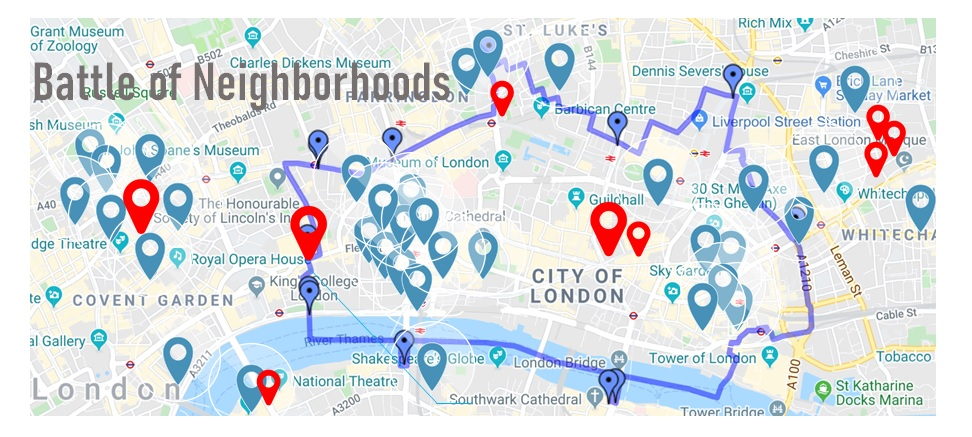

***

## Table of contents

* [Introduction](#introduction)
* [Business Problem](#business-problem)
* [Analytic Approach](#analytic-approach)
* [Methodology](#methodology)
    * [Data Collection](#dataprep)
    * [Data Preparation](#dataprep)
    * [Modeling](#datamodeling)
* [Evaluation](#evaluation)
* [Results](#results)
* [Discussion](#discussion)
* [Conclusion](#conclusion)
* [References](#references)

***

# Introduction

The MLA Inc. founded in 2011, with headquarters in Chicago has experienced year on year a substantial growth on their business of supplying Gym and Gym appliances.

The innovative concept of Gym, associated with Digitization, AI, and his strong brand “GoGo Fitness”, allowed MLA Inc. to become the market leader in USA.

The MLA vision and strategy are to expand to markets outside USA. In 2019, the executive board from MLA Inc., chaired by Mr. J.L. Champs (CEO), has decided to expand their Gym concept to UK. The business plan is to start in 2020, with 5 new gym in the City of London, and grow from there to other main cities in the subsequent years.


The MLA business expansion to UK has enormous importance in shareholders strategy, therefore Mr. J. L. Champs has set this program at the highest priority for 2020. 
Mr. Champs has assigned 3 of his champions for this program coded “The Battle of Neighborhoods”.

The program main stakeholders and sponsors are Mrs. S. K. Voort (CMO), Mr. L. A. Raidillon (CDO), and Mrs. C. H. Nagasaki (COO).

Mr. Raidillon has agreed with his peers to bring on board his senior data scientist (Mr. A. R. Duarte) to help with business problem resolution.

# Business Problem

Due to the high importance of “The Battle of Neighborhoods” program, it is from upmost importance to select the right locations for the first 5 Gyms in the City of London.

The stakeholders came up with following requirements (business problem):

Which neighborhood in the City of London has ‘Gym’ in top 10 venues?

Which neighborhood in the City of London has “Gym” in the top 5 most common venues?

How is the Gym market segmented in the City of London?

Which are the best recommended districts in the City of London to setup the 5 gyms?


# Analytic Approach

The business problem requests customer segmentation per location. 
The data science team decided to explore the data with a cluster algorithm to see whether a natural statistical separation exists

# Methodology

The Data Science team has been tasked to produce a report to highlight the Gym market segment distribution across the boroughs and neighborhoods of the **City of London**

This project will derive the answer to business problem of finding where are the top 5 districts in the City of London where Gym is within the top 5 most common venues.


## Data Sources

The team decided to leverage the Foursquare location data API to solve the problem in combination with two other datasets.

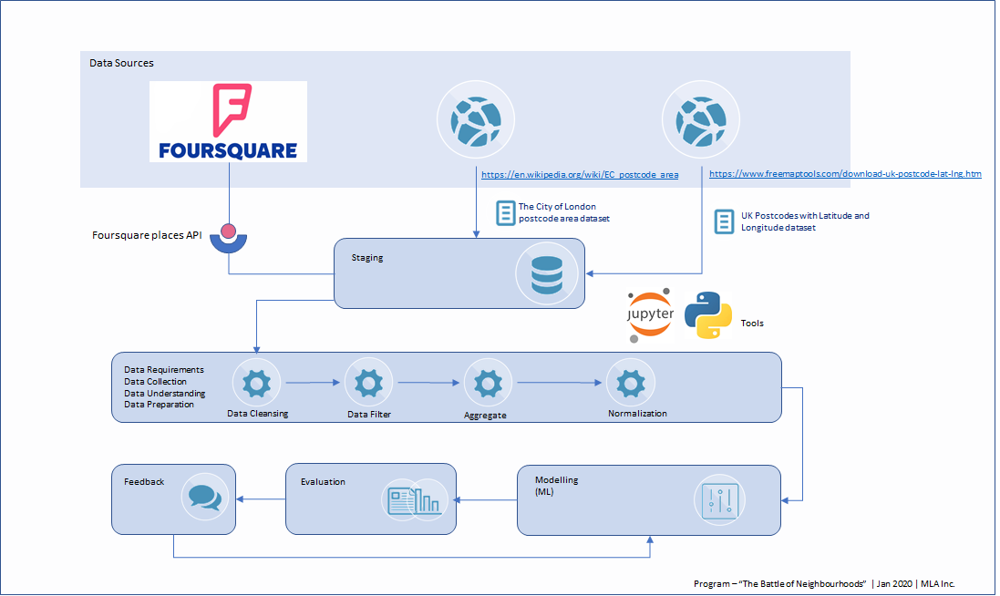

## For this project, we will explore and cluster the districts and neighborhoods in The City of London.

We will use the following dataset, **[UK Postcodes with Latitude and Longitude](https://www.freemaptools.com/download-uk-postcode-lat-lng.htm)**, this dataset contains all the UK postcodes with respective latitude and longitude. Because our target is the **City of London**, we will need to work with an additional dataset **[The City of London postcode area](https://en.wikipedia.org/wiki/EC_postcode_area)**, this dataset can be found in the Wikipedia, and lists the district post codes from the **City of London**. 





**First we will import the required libraries for this project**

In [1]:
# Import all libraries and dependencies

import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # intall geopy
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.5.0 --yes #install folium
import folium # map rendering library

import seaborn as sn   #seaborn library is loaded to improve our graphs

print('Libraries imported.')

Solving environment: done

## Package Plan ##

  environment location: /opt/conda/envs/Python36

  added / updated specs: 
    - geopy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    openssl-1.1.1d             |       h516909a_0         2.1 MB  conda-forge
    geographiclib-1.50         |             py_0          34 KB  conda-forge
    geopy-1.20.0               |             py_0          57 KB  conda-forge
    certifi-2019.11.28         |           py36_0         149 KB  conda-forge
    ca-certificates-2019.11.28 |       hecc5488_0         145 KB  conda-forge
    ------------------------------------------------------------
                                           Total:         2.5 MB

The following NEW packages will be INSTALLED:

    geographiclib:   1.50-py_0         conda-forge
    geopy:           1.20.0-py_0       conda-forge

The following packages will be UPDATED:

    ca-

## Data preparation

We have staging the "**UK Postcodes with Latitude and Longitude**" and "**The City of London postcode area**" datasets in a bucket in the IBM Cloud. We are going to load those datasets in two pandas dataframe and start cleansing the data.

In [2]:
# getting the datsets from the staging bucket.

!wget -q -O 'UKpostcodes_lat_long.csv' https://cloud-object-storage-kt-cos-standard-vw9.s3.us-south.cloud-object-storage.appdomain.cloud/ukpostcodes.csv
print('Data downloaded from url_1!')

# load "UK postcodes" dataset to a pandas dataframe
uk_postcodes_df = pd.read_csv('UKpostcodes_lat_long.csv')

#  inspect the 5 first items
uk_postcodes_df.head(5)

Data downloaded from url_1!


,id,postcode,latitude,longitude
0,1,AB10 1XG,57.144165,-2.114848
1,2,AB10 6RN,57.137880,-2.121487
2,3,AB10 7JB,57.124274,-2.127190
3,4,AB11 5QN,57.142701,-2.093295
4,5,AB11 6UL,57.137547,-2.112233


We are going to modify the **ast_note_interactivity** kernel option to make jupyter do this for any variable or statement on it’s own line, so we can see the value of multiple statements at once.

In [3]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [4]:
# inpecting the dataframe for head and tail
uk_postcodes_df.head(5)
uk_postcodes_df.tail(5)

,id,postcode,latitude,longitude
0,1,AB10 1XG,57.144165,-2.114848
1,2,AB10 6RN,57.137880,-2.121487
2,3,AB10 7JB,57.124274,-2.127190
3,4,AB11 5QN,57.142701,-2.093295
4,5,AB11 6UL,57.137547,-2.112233


,id,postcode,latitude,longitude
1758221,2649010,YO8 9SN,53.775330,-1.129099
1758222,2649011,YO8 9SP,53.767117,-1.089415
1758223,2649012,YO8 9TR,53.771989,-1.120702
1758224,2649013,ZE2 9FJ,60.128408,-1.208825
1758225,2649014,ZE2 9FN,60.128408,-1.208825


Let's load also the "city of London district postcodes" to a pandas dataframe

In [5]:
# load "City of London district postcodes" dataset to a pandas dataframe
!wget -q -O 'city-of-london-district-postcodes.csv' https://cloud-object-storage-kt-cos-standard-vw9.s3.us-south.cloud-object-storage.appdomain.cloud/city-of-london-district-postcode-areas.csv
print('Data downloaded from url_2!')

city_of_london_postcodes_df = pd.read_csv('city-of-london-district-postcodes.csv')

#  inspect the 5 first items
city_of_london_postcodes_df.head()
city_of_london_postcodes_df.tail()

Data downloaded from url_2!


,Postcode district,Post town,Coverage,Local authority area
0,EC1A,LONDON,St Bartholomew's Hospital,"City of London, Islington"
1,EC1M,LONDON,"Clerkenwell, Farringdon","Islington, Camden, City of London"
2,EC1N,LONDON,Hatton Garden,"Camden, City of London"
3,EC1P,LONDON,NaN,non-geographic
4,EC1R,LONDON,"Finsbury, Finsbury Estate (west)","Islington, Camden"


,Postcode district,Post town,Coverage,Local authority area
23,EC4P,LONDON,NaN,non-geographic
24,EC4R,LONDON,Cannon Street,City of London
25,EC4V,LONDON,Blackfriars,City of London
26,EC4Y,LONDON,Temple,"City of London, Westminster"
27,EC50,LONDON,NaN,non-geographic


The dataframe **uk_postcodes_df** contains 5 columns **dataframe_row_id| id (from original dataset) | postcode | latitude | longitude**. We don't need the id (from original dataset), so we are going to drop this column.

In [6]:
# we will drop the column 'id'

uk_postcodes_df.drop(['id'], axis=1, inplace=True)

uk_postcodes_df.tail()

,postcode,latitude,longitude
1758221,YO8 9SN,53.775330,-1.129099
1758222,YO8 9SP,53.767117,-1.089415
1758223,YO8 9TR,53.771989,-1.120702
1758224,ZE2 9FJ,60.128408,-1.208825
1758225,ZE2 9FN,60.128408,-1.208825


In this Uk_postcodes dataframe, we have observed that postcode is composed from **District code** + **Neighborhood code**. We are going to create a new column in this dateset whic contains only the District code, since we will need this data when we plan to intersect this data frame with one from City of London district codes.

In [7]:
# new data frame with split the value of postcode column
# we use space (” “) as delimiter, and the expand parameter is set to True, which means it will return a data frame with all separated strings in different columns. 
split_postcode_df = uk_postcodes_df["postcode"].str.split(" ", n = 1, expand = True)

# making separate district column from split_postcode_df data frame 
uk_postcodes_df['district'] = split_postcode_df[0]

# making separate neighborhood postcode column from split_postcode_df data frame
uk_postcodes_df['neighborhood'] = split_postcode_df[1]

uk_postcodes_df.head()
uk_postcodes_df.tail()

,postcode,latitude,longitude,district,neighborhood
0,AB10 1XG,57.144165,-2.114848,AB10,1XG
1,AB10 6RN,57.137880,-2.121487,AB10,6RN
2,AB10 7JB,57.124274,-2.127190,AB10,7JB
3,AB11 5QN,57.142701,-2.093295,AB11,5QN
4,AB11 6UL,57.137547,-2.112233,AB11,6UL


,postcode,latitude,longitude,district,neighborhood
1758221,YO8 9SN,53.775330,-1.129099,YO8,9SN
1758222,YO8 9SP,53.767117,-1.089415,YO8,9SP
1758223,YO8 9TR,53.771989,-1.120702,YO8,9TR
1758224,ZE2 9FJ,60.128408,-1.208825,ZE2,9FJ
1758225,ZE2 9FN,60.128408,-1.208825,ZE2,9FN


Now, we have in the dataframe uk_postcodes_df2, the UK districts as well as latitude and longitude. It is time to do data cleansing in the dataframe city_of_london_postcodes_df .

In [8]:
city_of_london_postcodes_df.head(1)

,Postcode district,Post town,Coverage,Local authority area
0,EC1A,LONDON,St Bartholomew's Hospital,"City of London, Islington"


From this dataframe, we are mainly interested in the columns **Postcode district | Post town | Local authority area**. So we will drop the **Coverage** column.

In [9]:
#we are going to drop 'Coverage' column

city_of_london_postcodes_df.drop(['Coverage'], axis=1, inplace=True)

city_of_london_postcodes_df.head()
city_of_london_postcodes_df.tail()

,Postcode district,Post town,Local authority area
0,EC1A,LONDON,"City of London, Islington"
1,EC1M,LONDON,"Islington, Camden, City of London"
2,EC1N,LONDON,"Camden, City of London"
3,EC1P,LONDON,non-geographic
4,EC1R,LONDON,"Islington, Camden"


,Postcode district,Post town,Local authority area
23,EC4P,LONDON,non-geographic
24,EC4R,LONDON,City of London
25,EC4V,LONDON,City of London
26,EC4Y,LONDON,"City of London, Westminster"
27,EC50,LONDON,non-geographic


In [10]:
# rename the column 'Postcode district' to 'district'
city_of_london_postcodes_df.rename(columns={'Postcode district': 'district'}, inplace=True)
city_of_london_postcodes_df.head()

,district,Post town,Local authority area
0,EC1A,LONDON,"City of London, Islington"
1,EC1M,LONDON,"Islington, Camden, City of London"
2,EC1N,LONDON,"Camden, City of London"
3,EC1P,LONDON,non-geographic
4,EC1R,LONDON,"Islington, Camden"


The dataframe city_of_london_postcodes_df has entries like the one in row 3, where the district is just an adminstrative code and do not have the corresponding latitude and longitude, therefore we need to remove all those entries from the dataframe.

In [11]:
# Remove all rows from dataframe where Local authority area = 'Not assigned'

index_names = city_of_london_postcodes_df[city_of_london_postcodes_df['Local authority area'] == 'non-geographic'].index

city_of_london_postcodes_df.drop(index_names, axis=0, inplace=True)

city_of_london_postcodes_df.head()

,district,Post town,Local authority area
0,EC1A,LONDON,"City of London, Islington"
1,EC1M,LONDON,"Islington, Camden, City of London"
2,EC1N,LONDON,"Camden, City of London"
4,EC1R,LONDON,"Islington, Camden"
5,EC1V,LONDON,"Islington, Hackney"


In [12]:
city_of_london_postcodes_df.shape

(23, 3)

In [13]:
city_of_london_postcodes_df.head(23)

,district,Post town,Local authority area
0,EC1A,LONDON,"City of London, Islington"
1,EC1M,LONDON,"Islington, Camden, City of London"
2,EC1N,LONDON,"Camden, City of London"
4,EC1R,LONDON,"Islington, Camden"
5,EC1V,LONDON,"Islington, Hackney"
6,EC1Y,LONDON,"Islington, City of London"
7,EC2A,LONDON,"Islington, Hackney, City of London"
8,EC2M,LONDON,Tower Hamlets
9,EC2N,LONDON,City of London
11,EC2R,LONDON,City of London


Now we are going to merge both city_of_london_postcodes_df() and uk_postcodes_df. we will use the option 'inner'to get a dataframe with only data relevant to City of London.

In [14]:
# merge dataframes

city_of_london_df = pd.merge(uk_postcodes_df, city_of_london_postcodes_df, how='inner', on=['district'])

In [15]:
city_of_london_df.head()
city_of_london_df.tail()

,postcode,latitude,longitude,district,neighborhood,Post town,Local authority area
0,EC4Y 0AY,51.512616,-0.106828,EC4Y,0AY,LONDON,"City of London, Westminster"
1,EC4Y 0BH,51.512625,-0.108328,EC4Y,0BH,LONDON,"City of London, Westminster"
2,EC4Y 0BS,51.511985,-0.107144,EC4Y,0BS,LONDON,"City of London, Westminster"
3,EC4Y 0DA,51.511833,-0.108217,EC4Y,0DA,LONDON,"City of London, Westminster"
4,EC4Y 0DB,51.511833,-0.108217,EC4Y,0DB,LONDON,"City of London, Westminster"


,postcode,latitude,longitude,district,neighborhood,Post town,Local authority area
3371,EC1A 4JW,51.521952,-0.098229,EC1A,4JW,LONDON,"City of London, Islington"
3372,EC1A 7BD,51.518864,-0.098559,EC1A,7BD,LONDON,"City of London, Islington"
3373,EC1A 7BL,51.517671,-0.098753,EC1A,7BL,LONDON,"City of London, Islington"
3374,EC1A 7BF,51.518407,-0.098636,EC1A,7BF,LONDON,"City of London, Islington"
3375,EC1A 7BG,51.518578,-0.099220,EC1A,7BG,LONDON,"City of London, Islington"


In [16]:
city_of_london_df.shape

(3376, 7)

### Let's print the number of districts and neighborhoods we have on this dataframe

In [17]:
print('The dataframe has {} districts and {} neighborhoods.'.format(
        len(city_of_london_df['district'].unique()),
        city_of_london_df.shape[0]
    )
)

The dataframe has 23 districts and 3376 neighborhoods.


---

## We can now leverage Foursquare location API, together with our cleaned and prepared dataframe to explore the venues in the City of London.

---

## Data Modeling

### Explore and cluster the neighborhoods in the City of London.

Use geopy library to get the latitude and longitude values of the City of London. In order to define an instance of the geocoder, we need to define a user_agent. We will name our agent city-of-london_explorer, as shown below.

In [18]:
address = 'City of London,London,UK'

geolocator = Nominatim(user_agent="city-of-london_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of City of London are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of City of London are 51.5156177, -0.0919983.


## Create a map of City of London with neighborhoods superimposed on top.

In [19]:
# We are setting back the interativeShell to default. so we don't need to have all the outputs of map creation, but just the final result.
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "last_expr"

In [20]:
# The region of City of London is composed of 23 districts, we will divide in indivual dtatrames per district
# EC1[A,M,N,R,V,Y]
ec1a_df = city_of_london_df[city_of_london_df['district'] == 'EC1A'].reset_index(drop=True)
ec1m_df = city_of_london_df[city_of_london_df['district'] == 'EC1M'].reset_index(drop=True)
ec1n_df = city_of_london_df[city_of_london_df['district'] == 'EC1N'].reset_index(drop=True)
ec1r_df = city_of_london_df[city_of_london_df['district'] == 'EC1R'].reset_index(drop=True)
ec1v_df = city_of_london_df[city_of_london_df['district'] == 'EC1V'].reset_index(drop=True)
ec1y_df = city_of_london_df[city_of_london_df['district'] == 'EC1Y'].reset_index(drop=True)

# EC2[A,M,N,R,V,Y]
ec2a_df = city_of_london_df[city_of_london_df['district'] == 'EC2A'].reset_index(drop=True)
ec2m_df = city_of_london_df[city_of_london_df['district'] == 'EC2M'].reset_index(drop=True)
ec2n_df = city_of_london_df[city_of_london_df['district'] == 'EC2N'].reset_index(drop=True)
ec2r_df = city_of_london_df[city_of_london_df['district'] == 'EC2R'].reset_index(drop=True)
ec2v_df = city_of_london_df[city_of_london_df['district'] == 'EC2V'].reset_index(drop=True)
ec2y_df = city_of_london_df[city_of_london_df['district'] == 'EC2Y'].reset_index(drop=True)

# EC3[A,M,N,R,V]
ec3a_df = city_of_london_df[city_of_london_df['district'] == 'EC3A'].reset_index(drop=True)
ec3m_df = city_of_london_df[city_of_london_df['district'] == 'EC3M'].reset_index(drop=True)
ec3n_df = city_of_london_df[city_of_london_df['district'] == 'EC3N'].reset_index(drop=True)
ec3r_df = city_of_london_df[city_of_london_df['district'] == 'EC3R'].reset_index(drop=True)
ec3v_df = city_of_london_df[city_of_london_df['district'] == 'EC3V'].reset_index(drop=True)


# EC2[A,M,N,R,V,Y]
ec4a_df = city_of_london_df[city_of_london_df['district'] == 'EC4A'].reset_index(drop=True)
ec4m_df = city_of_london_df[city_of_london_df['district'] == 'EC4M'].reset_index(drop=True)
ec4n_df = city_of_london_df[city_of_london_df['district'] == 'EC4N'].reset_index(drop=True)
ec4r_df = city_of_london_df[city_of_london_df['district'] == 'EC4R'].reset_index(drop=True)
ec4v_df = city_of_london_df[city_of_london_df['district'] == 'EC4V'].reset_index(drop=True)
ec4y_df = city_of_london_df[city_of_london_df['district'] == 'EC4Y'].reset_index(drop=True)

In [21]:
ec1a_df.shape

(178, 7)

## Let's get the coordinates of EC1A

In [22]:
address = 'EC1A, London'

geolocator = Nominatim(user_agent="EC1A_explorer")
location_ec1a = geolocator.geocode(address)
latitude_ec1a = location.latitude
longitude_ec1a = location.longitude
print('The geograpical coordinate of EC1A Islington are {}, {}.'.format(latitude_ec1a, longitude_ec1a))

The geograpical coordinate of EC1A Islington are 51.5156177, -0.0919983.


In [23]:
# create map of district [EC1A] in the City of London using latitude and longitude values
map_city_of_london_ec1a = folium.Map(location=[latitude_ec1a, longitude_ec1a], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec1a_df['latitude'], ec1a_df['longitude'], ec1a_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec1a)  
    
map_city_of_london_ec1a

## Let's get the coordinates of EC1M (Islington, Camden)

In [24]:
address = 'EC1M, London'

geolocator = Nominatim(user_agent="EC1M_explorer")
location_ec1m = geolocator.geocode(address)
latitude_ec1m = location.latitude
longitude_ec1m = location.longitude
print('The geograpical coordinate of EC1M Islington, Camden are {}, {}.'.format(latitude_ec1m, longitude_ec1m))

The geograpical coordinate of EC1M Islington, Camden are 51.5156177, -0.0919983.


In [25]:
# create map of district [EC1M] in the City of London using latitude and longitude values
map_city_of_london_ec1m = folium.Map(location=[latitude_ec1m, longitude_ec1m], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec1m_df['latitude'], ec1m_df['longitude'], ec1m_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec1m)  
    
map_city_of_london_ec1m

## Let's get the coordinates of EC1N (Camden)

In [26]:
address = 'EC1N, London'

geolocator = Nominatim(user_agent="EC1N_explorer")
location_ec1n = geolocator.geocode(address)
latitude_ec1n = location.latitude
longitude_ec1n = location.longitude
print('The geograpical coordinate of EC1N Camden are {}, {}.'.format(latitude_ec1n, longitude_ec1n))

The geograpical coordinate of EC1N Camden are 51.5156177, -0.0919983.


In [27]:
# create map of district [EC1N] in the City of London using latitude and longitude values
map_city_of_london_ec1n = folium.Map(location=[latitude_ec1n, longitude_ec1n], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec1n_df['latitude'], ec1n_df['longitude'], ec1n_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec1n)  
    
map_city_of_london_ec1n

## Let's get the coordinates of EC1R (Islington)

In [28]:
address = 'EC1R, London'

geolocator = Nominatim(user_agent="EC1R_explorer")
location_ec1r = geolocator.geocode(address)
latitude_ec1r = location.latitude
longitude_ec1r = location.longitude
print('The geograpical coordinate of EC1R Islington are {}, {}.'.format(latitude_ec1r, longitude_ec1r))

The geograpical coordinate of EC1R Islington are 51.5156177, -0.0919983.


In [29]:
# create map of district [EC1R] in the City of London using latitude and longitude values
map_city_of_london_ec1r = folium.Map(location=[latitude_ec1r, longitude_ec1r], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec1r_df['latitude'], ec1r_df['longitude'], ec1r_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec1r)  
    
map_city_of_london_ec1r

## Let's get the coordinates of EC1V (Islington)

In [30]:
address = 'EC1V, London'

geolocator = Nominatim(user_agent="EC1V_explorer")
location_ec1v = geolocator.geocode(address)
latitude_ec1v = location.latitude
longitude_ec1v = location.longitude
print('The geograpical coordinate of EC1V Islington are {}, {}.'.format(latitude_ec1v, longitude_ec1v))

The geograpical coordinate of EC1V Islington are 51.5156177, -0.0919983.


In [31]:
# create map of district [EC1V] in the City of London using latitude and longitude values
map_city_of_london_ec1v = folium.Map(location=[latitude_ec1v, longitude_ec1v], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec1v_df['latitude'], ec1v_df['longitude'], ec1v_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec1v)  
    
map_city_of_london_ec1v

## Let's get the coordinates of EC1Y (Islington)

In [32]:
address = 'EC1Y, London'

geolocator = Nominatim(user_agent="EC1Y_explorer")
location_ec1y = geolocator.geocode(address)
latitude_ec1y = location.latitude
longitude_ec1y = location.longitude
print('The geograpical coordinate of EC1Y Islington are {}, {}.'.format(latitude_ec1y, longitude_ec1y))

The geograpical coordinate of EC1Y Islington are 51.5156177, -0.0919983.


In [33]:
# create map of district [EC1Y] in the City of London using latitude and longitude values
map_city_of_london_ec1y = folium.Map(location=[latitude_ec1y, longitude_ec1y], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec1y_df['latitude'], ec1y_df['longitude'], ec1y_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec1y)  
    
map_city_of_london_ec1y

## Let's get the coordinates of EC2A (Islington, Hackney)

In [34]:
address = 'EC2A, London'

geolocator = Nominatim(user_agent="EC2A_explorer")
location_ec2a = geolocator.geocode(address)
latitude_ec2a = location.latitude
longitude_ec2a = location.longitude
print('The geograpical coordinate of EC2A Islington, Hackney are {}, {}.'.format(latitude_ec2a, longitude_ec2a))

The geograpical coordinate of EC2A Islington, Hackney are 51.5156177, -0.0919983.


In [35]:
# create map of district [EC2A] in the City of London using latitude and longitude values
map_city_of_london_ec2a = folium.Map(location=[latitude_ec2a, longitude_ec2a], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec2a_df['latitude'], ec2a_df['longitude'], ec2a_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec2a)  
    
map_city_of_london_ec2a

## Let's get the coordinates of EC2M (Tower Hamlets)

In [36]:
address = 'EC2M, London'

geolocator = Nominatim(user_agent="EC2M_explorer")
location_ec2m = geolocator.geocode(address)
latitude_ec2m = location.latitude
longitude_ec2m = location.longitude
print('The geograpical coordinate of EC2M Tower Hamlets are {}, {}.'.format(latitude_ec2m, longitude_ec2m))

The geograpical coordinate of EC2M Tower Hamlets are 51.5156177, -0.0919983.


In [37]:
# create map of district [EC2M] in the City of London using latitude and longitude values
map_city_of_london_ec2m = folium.Map(location=[latitude_ec2m, longitude_ec2m], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec2m_df['latitude'], ec2m_df['longitude'], ec2m_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec2m)  
    
map_city_of_london_ec2m

## Let's get the coordinates of EC2N (City of London)

In [38]:
address = 'EC2N, London'

geolocator = Nominatim(user_agent="EC2N_explorer")
location_ec2n = geolocator.geocode(address)
latitude_ec2n = location.latitude
longitude_ec2n = location.longitude
print('The geograpical coordinate of EC2N City of London are {}, {}.'.format(latitude_ec2n, longitude_ec2n))

The geograpical coordinate of EC2N City of London are 51.5156177, -0.0919983.


In [39]:
# create map of district [EC2N] in the City of London using latitude and longitude values
map_city_of_london_ec2n = folium.Map(location=[latitude_ec2n, longitude_ec2n], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec2n_df['latitude'], ec2n_df['longitude'], ec2n_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec2n)  
    
map_city_of_london_ec2n

## Let's get the coordinates of EC2R (City of London)

In [40]:
address = 'EC2R, London'

geolocator = Nominatim(user_agent="EC2R_explorer")
location_ec2r = geolocator.geocode(address)
latitude_ec2r = location.latitude
longitude_ec2r = location.longitude
print('The geograpical coordinate of EC2R City of London are {}, {}.'.format(latitude_ec2r, longitude_ec2r))

The geograpical coordinate of EC2R City of London are 51.5156177, -0.0919983.


In [41]:
# create map of district [EC2R] in the City of London using latitude and longitude values
map_city_of_london_ec2r = folium.Map(location=[latitude_ec2r, longitude_ec2r], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec2r_df['latitude'], ec2r_df['longitude'], ec2r_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec2r)  
    
map_city_of_london_ec2r

## Let's get the coordinates of EC2V (City of London)

In [42]:
address = 'EC2V, London'

geolocator = Nominatim(user_agent="EC2V_explorer")
location_ec2v = geolocator.geocode(address)
latitude_ec2v = location.latitude
longitude_ec2v = location.longitude
print('The geograpical coordinate of EC2V City of London are {}, {}.'.format(latitude_ec2v, longitude_ec2v))

The geograpical coordinate of EC2V City of London are 51.5156177, -0.0919983.


In [43]:
# create map of district [EC2V] in the City of London using latitude and longitude values
map_city_of_london_ec2v = folium.Map(location=[latitude_ec2v, longitude_ec2v], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec2v_df['latitude'], ec2v_df['longitude'], ec2v_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec2v)  
    
map_city_of_london_ec2v

## Let's get the coordinates of EC2Y (City of London)

In [44]:
address = 'EC2Y, London'

geolocator = Nominatim(user_agent="EC2Y_explorer")
location_ec2y = geolocator.geocode(address)
latitude_ec2y = location.latitude
longitude_ec2y = location.longitude
print('The geograpical coordinate of EC2Y City of London are {}, {}.'.format(latitude_ec2y, longitude_ec2y))

The geograpical coordinate of EC2Y City of London are 51.5156177, -0.0919983.


In [45]:
# create map of district [EC2Y] in the City of London using latitude and longitude values
map_city_of_london_ec2y = folium.Map(location=[latitude_ec2y, longitude_ec2y], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec2y_df['latitude'], ec2y_df['longitude'], ec2y_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec2y)  
    
map_city_of_london_ec2y

## Let's get the coordinates of EC3A (City of London)

In [46]:
address = 'EC3A, London'

geolocator = Nominatim(user_agent="EC3A_explorer")
location_ec3a = geolocator.geocode(address)
latitude_ec3a = location.latitude
longitude_ec3a = location.longitude
print('The geograpical coordinate of EC3A City of London are {}, {}.'.format(latitude_ec3a, longitude_ec3a))

The geograpical coordinate of EC3A City of London are 51.5156177, -0.0919983.


In [47]:
# create map of district [EC3A] in the City of London using latitude and longitude values
map_city_of_london_ec3a = folium.Map(location=[latitude_ec3a, longitude_ec3a], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec3a_df['latitude'], ec3a_df['longitude'], ec3a_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec3a)  
    
map_city_of_london_ec3a

## Let's get the coordinates of EC3M (City of London)

In [48]:
address = 'EC3M, London'

geolocator = Nominatim(user_agent="EC3M_explorer")
location_ec3m = geolocator.geocode(address)
latitude_ec3m = location.latitude
longitude_ec3m = location.longitude
print('The geograpical coordinate of EC3M City of London are {}, {}.'.format(latitude_ec3m, longitude_ec3m))

The geograpical coordinate of EC3M City of London are 51.5156177, -0.0919983.


In [49]:
# create map of district [EC3M] in the City of London using latitude and longitude values
map_city_of_london_ec3m = folium.Map(location=[latitude_ec3m, longitude_ec3m], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec3m_df['latitude'], ec3m_df['longitude'], ec3m_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec3m)  
    
map_city_of_london_ec3m

## Let's get the coordinates of EC3N (Tower Hamlets)

In [50]:
address = 'EC3N, London'

geolocator = Nominatim(user_agent="EC3N_explorer")
location_ec3n = geolocator.geocode(address)
latitude_ec3n = location.latitude
longitude_ec3n = location.longitude
print('The geograpical coordinate of EC3M Tower Hamlets are {}, {}.'.format(latitude_ec3n, longitude_ec3n))

The geograpical coordinate of EC3M Tower Hamlets are 51.5156177, -0.0919983.


In [51]:
# create map of district [EC3N] in the City of London using latitude and longitude values
map_city_of_london_ec3n = folium.Map(location=[latitude_ec3n, longitude_ec3n], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec3n_df['latitude'], ec3n_df['longitude'], ec3n_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec3n)  
    
map_city_of_london_ec3n

## Let's get the coordinates of EC3R (City of London)

In [52]:
address = 'EC3R, London'

geolocator = Nominatim(user_agent="EC3R_explorer")
location_ec3r = geolocator.geocode(address)
latitude_ec3r = location.latitude
longitude_ec3r = location.longitude
print('The geograpical coordinate of EC3R City of London are {}, {}.'.format(latitude_ec3r, longitude_ec3r))

The geograpical coordinate of EC3R City of London are 51.5156177, -0.0919983.


In [53]:
# create map of district [EC3R] in the City of London using latitude and longitude values
map_city_of_london_ec3r = folium.Map(location=[latitude_ec3r, longitude_ec3r], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec3r_df['latitude'], ec3r_df['longitude'], ec3r_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec3r)  
    
map_city_of_london_ec3r

## Let's get the coordinates of EC3V (City of London)

In [54]:
address = 'EC3V, London'

geolocator = Nominatim(user_agent="EC3V_explorer")
location_ec3v = geolocator.geocode(address)
latitude_ec3v = location.latitude
longitude_ec3v = location.longitude
print('The geograpical coordinate of EC3V City of London are {}, {}.'.format(latitude_ec3v, longitude_ec3v))

The geograpical coordinate of EC3V City of London are 51.5156177, -0.0919983.


In [55]:
# create map of district [EC3V] in the City of London using latitude and longitude values
map_city_of_london_ec3v = folium.Map(location=[latitude_ec3v, longitude_ec3v], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec3v_df['latitude'], ec3v_df['longitude'], ec3v_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec3v)  
    
map_city_of_london_ec3v

## Let's get the coordinates of EC4A (Westminster)

Let's get the geographical coordinates of Westminster.

In [56]:
address = 'EC4A, London'

geolocator = Nominatim(user_agent="EC4A_explorer")
location_ec4a = geolocator.geocode(address)
latitude_ec4a = location.latitude
longitude_ec4a = location.longitude
print('The geograpical coordinate of EC4A City of London are {}, {}.'.format(latitude_ec4a, longitude_ec4a))

The geograpical coordinate of EC4A City of London are 51.5156177, -0.0919983.


Let's visualize the neighborhood in Westminster

In [57]:
# create map of district [EC4A] in the City of London using latitude and longitude values
map_city_of_london_ec4a = folium.Map(location=[latitude_ec4a, longitude_ec4a], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec4a_df['latitude'], ec4a_df['longitude'], ec4a_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec4a)  
    
map_city_of_london_ec4a

## Let's get the coordinates of EC4M (City of London)

In [58]:
address = 'EC4M, London'

geolocator = Nominatim(user_agent="EC4M_explorer")
location_ec4m = geolocator.geocode(address)
latitude_ec4m = location.latitude
longitude_ec4m = location.longitude
print('The geograpical coordinate of EC4M City of London are {}, {}.'.format(latitude_ec4m, longitude_ec4m))

The geograpical coordinate of EC4M City of London are 51.5156177, -0.0919983.


In [59]:
# create map of district [EC4M] in the City of London using latitude and longitude values
map_city_of_london_ec4m = folium.Map(location=[latitude_ec4m, longitude_ec4m], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec4m_df['latitude'], ec4m_df['longitude'], ec4m_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec4m)  
    
map_city_of_london_ec4m

## Let's get the coordinates of EC4N (City of London)

In [60]:
address = 'EC4N, London'

geolocator = Nominatim(user_agent="EC4N_explorer")
location_ec4n = geolocator.geocode(address)
latitude_ec4n = location.latitude
longitude_ec4n = location.longitude
print('The geograpical coordinate of EC4N City of London are {}, {}.'.format(latitude_ec4n, longitude_ec4n))

The geograpical coordinate of EC4N City of London are 51.5156177, -0.0919983.


In [61]:
# create map of district [EC4N] in the City of London using latitude and longitude values
map_city_of_london_ec4n = folium.Map(location=[latitude_ec4n, longitude_ec4n], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec4n_df['latitude'], ec4n_df['longitude'], ec4n_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec4n)  
    
map_city_of_london_ec4n

## Let's get the coordinates of EC4R (City of London)

In [62]:
address = 'EC4R, London'

geolocator = Nominatim(user_agent="EC4R_explorer")
location_ec4r = geolocator.geocode(address)
latitude_ec4r = location.latitude
longitude_ec4r = location.longitude
print('The geograpical coordinate of EC4R City of London are {}, {}.'.format(latitude_ec4r, longitude_ec4r))

The geograpical coordinate of EC4R City of London are 51.5156177, -0.0919983.


In [63]:
# create map of district [EC4R] in the City of London using latitude and longitude values
map_city_of_london_ec4r = folium.Map(location=[latitude_ec4r, longitude_ec4r], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec4r_df['latitude'], ec4r_df['longitude'], ec4r_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec4r)  
    
map_city_of_london_ec4r

## Let's get the coordinates of EC4V (City of London)

In [64]:
address = 'EC4V, London'

geolocator = Nominatim(user_agent="EC4V_explorer")
location_ec4v = geolocator.geocode(address)
latitude_ec4v = location.latitude
longitude_ec4v = location.longitude
print('The geograpical coordinate of EC4V City of London are {}, {}.'.format(latitude_ec4v, longitude_ec4v))

The geograpical coordinate of EC4V City of London are 51.5156177, -0.0919983.


In [65]:
# create map of district [EC4V] in the City of London using latitude and longitude values
map_city_of_london_ec4v = folium.Map(location=[latitude_ec4v, longitude_ec4v], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec4v_df['latitude'], ec4v_df['longitude'], ec4v_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec4v)  
    
map_city_of_london_ec4v

## Let's get the coordinates of EC4Y (Westminster)

In [66]:
address = 'EC4Y, London'

geolocator = Nominatim(user_agent="EC4Y_explorer")
location_ec4y = geolocator.geocode(address)
latitude_ec4y = location.latitude
longitude_ec4y = location.longitude
print('The geograpical coordinate of EC4Y Westminster are {}, {}.'.format(latitude_ec4y, longitude_ec4y))

The geograpical coordinate of EC4Y Westminster are 51.5156177, -0.0919983.


In [67]:
# create map of district [EC4Y] in the City of London using latitude and longitude values
map_city_of_london_ec4y = folium.Map(location=[latitude_ec4y, longitude_ec4y], zoom_start=15)

# add markers to map
for lat, lng, postcodes in zip(ec4y_df['latitude'], ec4y_df['longitude'], ec4y_df['postcode']):
    label = '{}'.format(postcodes)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_city_of_london_ec4y)  
    
map_city_of_london_ec4y

### Next, we are going to start utilizing the Foursquare API to explore the neighborhoods and segment them.



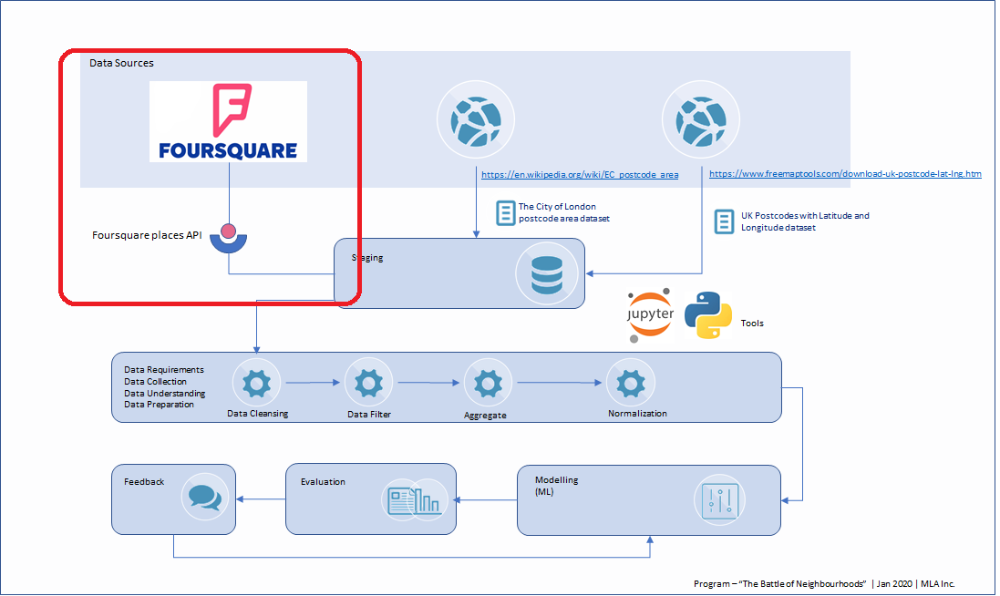

Define Foursquare Credentials and Version

In [68]:
#CLIENT_ID = 'your-client-ID' # your Foursquare ID
#CLIENT_SECRET = 'your-client-secret' # your Foursquare Secret
CLIENT_ID = 'HALLXBXGZGHCYB5VMP1PPSQ43D2TJWGU5ORSDY4OZDWQKW5K' # your Foursquare ID
CLIENT_SECRET = 'T5IRXH5ZXUCISPPEI1UI0RW02KISPDOFUIWZBKPK2II53PJL' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: HALLXBXGZGHCYB5VMP1PPSQ43D2TJWGU5ORSDY4OZDWQKW5K
CLIENT_SECRET:T5IRXH5ZXUCISPPEI1UI0RW02KISPDOFUIWZBKPK2II53PJL


### First, let's create the GET request URL. in order to explore EC1A

In [69]:
LIMIT = 100 # limit of number of venues returned by Foursquare API

radius = 500 # define radius in meters

# create URL
url_ec1a = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude_ec1a, 
    longitude_ec1a, 
    radius, 
    LIMIT)
# display URL
url_ec1a

'https://api.foursquare.com/v2/venues/explore?&client_id=HALLXBXGZGHCYB5VMP1PPSQ43D2TJWGU5ORSDY4OZDWQKW5K&client_secret=T5IRXH5ZXUCISPPEI1UI0RW02KISPDOFUIWZBKPK2II53PJL&v=20180605&ll=51.5156177,-0.0919983&radius=500&limit=100'

#### Let's send the GET request and examine the results

In [70]:
results_ec1a = requests.get(url_ec1a).json()
results_ec1a

{'meta': {'code': 200, 'requestId': '5e260dfcb57e88001b77ad4e'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'City of London',
  'headerFullLocation': 'City of London, London',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 175,
  'suggestedBounds': {'ne': {'lat': 51.5201177045, 'lng': -0.0847805703420935},
   'sw': {'lat': 51.5111176955, 'lng': -0.0992160296579065}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4c5190663940be9a0f2c0f09',
       'name': 'Goodman Steak House Restaurant',
       'location': {'address': '11 Old Jewry',
        'lat': 51.51439802733941,
        'lng': -0.09074537518056014,
        'labeledLatLngs': [{'label': 'display',
        

Let's create a get_category_type function to retrieve venues from the Jason results.

In [71]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

## Let's then clean results for EC1A venues

In [97]:
venues = results_ec1a['response']['groups'][0]['items']
    
nearby_venues_ec1a = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues_ec1a =nearby_venues_ec1a.loc[:, filtered_columns]

# filter the category for each row
nearby_venues_ec1a['venue.categories'] = nearby_venues_ec1a.apply(get_category_type, axis=1)

# clean columns
nearby_venues_ec1a.columns = [col.split(".")[-1] for col in nearby_venues_ec1a.columns]

nearby_venues_ec1a.head()

,name,categories,lat,lng
0,Goodman Steak House Restaurant,Steakhouse,51.514398,-0.090745
1,Daunt Books,Bookstore,51.513982,-0.092995
2,The Ned Hotel,Hotel,51.513755,-0.090067
3,Hawksmoor Guildhall,Steakhouse,51.515647,-0.090997
4,City Càphê,Vietnamese Restaurant,51.514750,-0.091545


### And how many venues were returned by Foursquare?

In [98]:
print('{} venues were returned by Foursquare for EC1A district.'.format(nearby_venues_ec1a.shape[0]))

100 venues were returned by Foursquare for EC1A district.


# Explore Neighborhoods in City of London per district

Let's create a function to repeat the same process to all the Districts/neighborhoods in the City of London

In [99]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Local Area', 
                  'Latitude', 
                  'Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

Now we write the code to run the above function on each District and create a dataframe per district

In [100]:
nearby_venues_ec1m = getNearbyVenues(names=ec1m_df['postcode'],
                                   latitudes=ec1m_df['latitude'],
                                   longitudes=ec1m_df['longitude']
                                  )

EC1M 5NR
EC1M 5NW
EC1M 5NY
EC1M 5NZ
EC1M 5PA
EC1M 5PE
EC1M 5PF
EC1M 5PG
EC1M 5PN
EC1M 5PQ
EC1M 5PS
EC1M 5PU
EC1M 5PW
EC1M 5PX
EC1M 5PY
EC1M 5PZ
EC1M 5QA
EC1M 5QD
EC1M 5QL
EC1M 5QP
EC1M 5QU
EC1M 5RD
EC1M 5RF
EC1M 5RJ
EC1M 5RN
EC1M 5RR
EC1M 5RS
EC1M 5SA
EC1M 5SX
EC1M 5SY
EC1M 5SZ
EC1M 5TW
EC1M 5TX
EC1M 5UA
EC1M 5UB
EC1M 5UD
EC1M 5UE
EC1M 5UG
EC1M 5UH
EC1M 5UJ
EC1M 5UL
EC1M 5UP
EC1M 5UQ
EC1M 5UR
EC1M 5US
EC1M 5UT
EC1M 5UU
EC1M 5UX
EC1M 5UY
EC1M 6AA
EC1M 6AD
EC1M 6AH
EC1M 6AN
EC1M 6AS
EC1M 6AU
EC1M 6AW
EC1M 6AX
EC1M 6BB
EC1M 6BD
EC1M 6BE
EC1M 6BF
EC1M 6BH
EC1M 6BN
EC1M 6BP
EC1M 6BQ
EC1M 6BW
EC1M 6BY
EC1M 6DB
EC1M 6DD
EC1M 6DF
EC1M 6DG
EC1M 6DH
EC1M 6DQ
EC1M 6DR
EC1M 6DS
EC1M 6DU
EC1M 6DW
EC1M 6DX
EC1M 6DZ
EC1M 6EA
EC1M 6EB
EC1M 6EE
EC1M 6EF
EC1M 6EG
EC1M 6EH
EC1M 6EJ
EC1M 6EL
EC1M 6EQ
EC1M 6ET
EC1M 6EU
EC1M 6EW
EC1M 6EX
EC1M 6EY
EC1M 6EZ
EC1M 6HA
EC1M 6HJ
EC1M 6HL
EC1M 6HR
EC1M 6HW
EC1M 6JH
EC1M 6JN
EC1M 6PB
EC1M 6PE
EC1M 6PF
EC1M 6PN
EC1M 6PQ
EC1M 6PR
EC1M 6PU
EC1M 6PX
EC1M 7AA
EC1M 7AD
E

Let's check the size of the nearby_venues_ec1m dataframe

In [101]:
print(nearby_venues_ec1m.shape)
nearby_venues_ec1m.head()

(15032, 7)


,Local Area,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,EC1M 5NR,51.521527,-0.103822,The Zetter Townhouse,51.522849,-0.103658,Hotel
1,EC1M 5NR,51.521527,-0.103822,BrewDog Clerkenwell,51.522401,-0.103835,Beer Bar
2,EC1M 5NR,51.521527,-0.103822,Jerusalem Tavern,51.521735,-0.104170,Pub
3,EC1M 5NR,51.521527,-0.103822,Granger & Co.,51.523504,-0.104629,Breakfast Spot
4,EC1M 5NR,51.521527,-0.103822,Luca,51.522017,-0.101703,Italian Restaurant


In [102]:
nearby_ve_ec1m = nearby_venues_ec1m.iloc[:,0:3]
nearby_ve_ec1m.rename(columns={"Local Area" : "Neighborhood"}, inplace=True)
nearby_ve_ec1m.head()

,Neighborhood,Latitude,Longitude
0,EC1M 5NR,51.521527,-0.103822
1,EC1M 5NR,51.521527,-0.103822
2,EC1M 5NR,51.521527,-0.103822
3,EC1M 5NR,51.521527,-0.103822
4,EC1M 5NR,51.521527,-0.103822


We have created the dataframe nearby_ve_ec1m so we can use to merge with our results from Foursquare API.

#### Let's check how many venues were returned for each postcode

In [103]:
nearby_venues_ec1m.groupby('Local Area').count()

,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Local Area,,,,,,
EC1M 3AF,81,81,81,81,81,81
EC1M 3HA,81,81,81,81,81,81
EC1M 3HE,77,77,77,77,77,77
EC1M 3JB,81,81,81,81,81,81
EC1M 3JF,81,81,81,81,81,81
EC1M 3JP,79,79,79,79,79,79
EC1M 3JQ,78,78,78,78,78,78
EC1M 3JU,78,78,78,78,78,78
EC1M 3JY,78,78,78,78,78,78


#### Let's find out how many unique categories can be curated from all the returned venues

In [104]:
print('There are {} uniques categories.'.format(len(nearby_venues_ec1m['Venue Category'].unique())))

There are 100 uniques categories.


## Let's Analyze Each Local Area

In [105]:
# one hot encoding
ec1m_onehot = pd.get_dummies(nearby_venues_ec1m[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
ec1m_onehot['Neighborhood'] = nearby_venues_ec1m['Local Area'] 

# move neighborhood column to the first column
fixed_columns = [ec1m_onehot.columns[-1]] + list(ec1m_onehot.columns[:-1])
ec1m_onehot = ec1m_onehot[fixed_columns]

ec1m_onehot.head()

,Neighborhood,Art Gallery,Asian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bar,Beer Bar,Belgian Restaurant,Bike Shop,Bookstore,Botanical Garden,Breakfast Spot,Burger Joint,Burrito Place,Café,Chinese Restaurant,Chocolate Shop,Church,Cocktail Bar,Coffee Shop,Concert Hall,Cosmetics Shop,Coworking Space,Cuban Restaurant,Dance Studio,Deli / Bodega,Donut Shop,Electronics Store,English Restaurant,Falafel Restaurant,Fast Food Restaurant,Fish & Chips Shop,Flea Market,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Garden,Gastropub,Gluten-free Restaurant,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Historic Site,History Museum,Hobby Shop,Hotel,Indian Restaurant,Indie Movie Theater,Italian Restaurant,Japanese Restaurant,Kebab Restaurant,Korean Restaurant,Lebanese Restaurant,Market,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Moroccan Restaurant,Museum,Nightclub,Park,Performing Arts Venue,Pie Shop,Pizza Place,Plaza,Pub,Ramen Restaurant,Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Seafood Restaurant,Soup Place,Souvlaki Shop,Spanish Restaurant,Sports Bar,Squash Court,Stationery Store,Steakhouse,Street Food Gathering,Supermarket,Sushi Restaurant,Taco Place,Tapas Restaurant,Tea Room,Thai Restaurant,Theater,Theme Park Ride / Attraction,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wine Shop,Yoga Studio
0,EC1M 5NR,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,EC1M 5NR,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,EC1M 5NR,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,EC1M 5NR,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,EC1M 5NR,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [106]:
# Let's check the size of the onehot dataframe
ec1m_onehot.shape

(15032, 101)

### let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [107]:
ec1m_grouped = ec1m_onehot.groupby('Neighborhood').mean().reset_index()
ec1m_grouped

,Neighborhood,Art Gallery,Asian Restaurant,BBQ Joint,Bagel Shop,Bakery,Bar,Beer Bar,Belgian Restaurant,Bike Shop,Bookstore,Botanical Garden,Breakfast Spot,Burger Joint,Burrito Place,Café,Chinese Restaurant,Chocolate Shop,Church,Cocktail Bar,Coffee Shop,Concert Hall,Cosmetics Shop,Coworking Space,Cuban Restaurant,Dance Studio,Deli / Bodega,Donut Shop,Electronics Store,English Restaurant,Falafel Restaurant,Fast Food Restaurant,Fish & Chips Shop,Flea Market,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Garden,Gastropub,Gluten-free Restaurant,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Historic Site,History Museum,Hobby Shop,Hotel,Indian Restaurant,Indie Movie Theater,Italian Restaurant,Japanese Restaurant,Kebab Restaurant,Korean Restaurant,Lebanese Restaurant,Market,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Moroccan Restaurant,Museum,Nightclub,Park,Performing Arts Venue,Pie Shop,Pizza Place,Plaza,Pub,Ramen Restaurant,Restaurant,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Seafood Restaurant,Soup Place,Souvlaki Shop,Spanish Restaurant,Sports Bar,Squash Court,Stationery Store,Steakhouse,Street Food Gathering,Supermarket,Sushi Restaurant,Taco Place,Tapas Restaurant,Tea Room,Thai Restaurant,Theater,Theme Park Ride / Attraction,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wine Shop,Yoga Studio
0,EC1M 3AF,0.000000,0.012346,0.000000,0.000000,0.012346,0.049383,0.012346,0.012346,0.000000,0.012346,0.000000,0.012346,0.00,0.024691,0.024691,0.000000,0.000000,0.000000,0.037037,0.037037,0.000000,0.000000,0.000000,0.00,0.000000,0.012346,0.012346,0.012346,0.000000,0.000000,0.012346,0.000000,0.000000,0.000000,0.049383,0.012346,0.012346,0.00,0.037037,0.000000,0.00,0.012346,0.000000,0.012346,0.000000,0.000000,0.00,0.024691,0.000000,0.037037,0.012346,0.000000,0.024691,0.012346,0.000000,0.012346,0.012346,0.012346,0.012346,0.024691,0.000000,0.000000,0.000000,0.000000,0.024691,0.000000,0.012346,0.037037,0.000000,0.123457,0.000000,0.012346,0.012346,0.000000,0.024691,0.000000,0.000000,0.000000,0.012346,0.012346,0.012346,0.000000,0.000000,0.012346,0.000000,0.000000,0.000000,0.000000,0.012346,0.012346,0.000000,0.000000,0.012346,0.000000,0.000000,0.037037,0.000000,0.000000,0.012346,0.000000
1,EC1M 3HA,0.000000,0.012346,0.000000,0.000000,0.000000,0.024691,0.049383,0.000000,0.000000,0.000000,0.000000,0.012346,0.00,0.024691,0.012346,0.000000,0.000000,0.012346,0.000000,0.123457,0.000000,0.000000,0.012346,0.00,0.000000,0.024691,0.012346,0.012346,0.012346,0.012346,0.000000,0.000000,0.012346,0.000000,0.037037,0.024691,0.000000,0.00,0.000000,0.012346,0.00,0.000000,0.012346,0.000000,0.024691,0.000000,0.00,0.012346,0.000000,0.037037,0.000000,0.000000,0.049383,0.000000,0.000000,0.012346,0.000000,0.000000,0.000000,0.012346,0.024691,0.012346,0.012346,0.012346,0.000000,0.000000,0.012346,0.012346,0.024691,0.111111,0.000000,0.012346,0.012346,0.000000,0.012346,0.000000,0.000000,0.000000,0.000000,0.012346,0.012346,0.000000,0.000000,0.000000,0.000000,0.000000,0.024691,0.000000,0.000000,0.012346,0.000000,0.000000,0.000000,0.000000,0.000000,0.024691,0.012346,0.037037,0.000000,0.000000
2,EC1M 3HE,0.000000,0.012987,0.000000,0.000000,0.000000,0.025974,0.051948,0.000000,0.000000,0.012987,0.000000,0.012987,0.00,0.025974,0.025974,0.000000,0.000000,0.012987,0.000000,0.129870,0.000000,0.000000,0.012987,0.00,0.000000,0.025974,0.012987,0.012987,0.012987,0.012987,0.000000,0.000000,0.012987,0.000000,0.038961,0.025974,0.000000,0.00,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.025974,0.000000,0.00,0.000000,0.000000,0.038961,0.000000,0.000000,0.038961,0.000000,0.000000,0.012987,0.000000,0.000000,0.000000,0.012987,0.025974,0.012987,0.012987,0.012987,0.000000,0.000000,0.012987,0.012987,0.012987,0.103896,0.000000,0.012987,0.012987,0.000000,0.012987,0.000000,0.000000,0.000000,0.000000,0.012987,0.012987,0.000000,0.000000,0.000000,0.000000,0.000

In [108]:
ec1m_grouped.shape

(189, 101)

### Let's print each neighborhood along with the top 5 most common venues

In [109]:
num_top_venues = 5

for hood in ec1m_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = ec1m_grouped[ec1m_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----EC1M 3AF----
         venue  freq
0          Pub  0.12
1   Food Truck  0.05
2          Bar  0.05
3  Pizza Place  0.04
4       Garden  0.04


----EC1M 3HA----
                venue  freq
0         Coffee Shop  0.12
1                 Pub  0.11
2  Italian Restaurant  0.05
3            Beer Bar  0.05
4            Wine Bar  0.04


----EC1M 3HE----
                venue  freq
0         Coffee Shop  0.13
1                 Pub  0.10
2            Beer Bar  0.05
3            Wine Bar  0.04
4  Italian Restaurant  0.04


----EC1M 3JB----
         venue  freq
0  Coffee Shop  0.12
1          Pub  0.12
2        Hotel  0.05
3     Beer Bar  0.05
4     Wine Bar  0.04


----EC1M 3JF----
                venue  freq
0         Coffee Shop  0.12
1                 Pub  0.11
2            Beer Bar  0.05
3  Italian Restaurant  0.05
4            Wine Bar  0.04


----EC1M 3JP----
         venue  freq
0          Pub  0.13
1  Coffee Shop  0.13
2        Hotel  0.05
3     Wine Bar  0.04
4     Beer Bar  0.04


----

<br>
<font color="#2e1a87" size=6 ><b>Let's print each neighborhood from EC1M along with the top 5 most common venues</b></font>

Let's create a function to sort the venues in descending order

In [110]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Let's create the new dataframe and display the top 10 venues for each neighborhood.

In [111]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted_ec1m = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted_ec1m['Neighborhood'] = ec1m_grouped['Neighborhood']

for ind in np.arange(ec1m_grouped.shape[0]):
    neighborhoods_venues_sorted_ec1m.iloc[ind, 1:] = return_most_common_venues(ec1m_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted_ec1m.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,EC1M 3AF,Pub,Bar,Food Truck,Hotel,Garden,Coffee Shop,Cocktail Bar,Pizza Place,Vietnamese Restaurant,Burrito Place
1,EC1M 3HA,Coffee Shop,Pub,Italian Restaurant,Beer Bar,Hotel,Wine Bar,Food Truck,Sushi Restaurant,Gym / Fitness Center,Deli / Bodega
2,EC1M 3HE,Coffee Shop,Pub,Beer Bar,Food Truck,Italian Restaurant,Hotel,Wine Bar,Burrito Place,Bar,Deli / Bodega
3,EC1M 3JB,Pub,Coffee Shop,Beer Bar,Hotel,Italian Restaurant,Wine Bar,Food Truck,Sushi Restaurant,Modern European Restaurant,Café
4,EC1M 3JF,Coffee Shop,Pub,Italian Restaurant,Beer Bar,Food Truck,Hotel,Wine Bar,French Restaurant,Sushi Restaurant,Modern European Restaurant


In [112]:
neighborhoods_venues_sorted_ec1m.shape

(189, 11)

In [113]:
gym_fitness_center_1st_common_venue_in_EC1M = neighborhoods_venues_sorted_ec1m.loc[neighborhoods_venues_sorted_ec1m['1st Most Common Venue'] == 'Gym / Fitness Center']
gym_fitness_center_1st_common_venue_in_EC1M.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue


In [90]:
gym_fitness_center_2nd_common_venue_in_EC1M = neighborhoods_venues_sorted_ec1m.loc[neighborhoods_venues_sorted_ec1m['2nd Most Common Venue'] == 'Gym / Fitness Center']
gym_fitness_center_2nd_common_venue_in_EC1M.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
11,EC1M 4AA,Pub,Gym / Fitness Center,French Restaurant,Café,Italian Restaurant,Coffee Shop,Hotel,Wine Bar,Bar,Beer Bar
13,EC1M 4AN,Pub,Gym / Fitness Center,Café,French Restaurant,Coffee Shop,Italian Restaurant,Hotel,Bar,Beer Bar,Sushi Restaurant
14,EC1M 4AR,Pub,Gym / Fitness Center,Café,French Restaurant,Hotel,Wine Bar,Coffee Shop,Italian Restaurant,Sushi Restaurant,Plaza
17,EC1M 4AZ,Pub,Gym / Fitness Center,French Restaurant,Hotel,Café,Italian Restaurant,Coffee Shop,Vietnamese Restaurant,Sushi Restaurant,Modern European Restaurant
18,EC1M 4BF,Pub,Gym / Fitness Center,Café,French Restaurant,Hotel,Italian Restaurant,Coffee Shop,Wine Bar,Bar,Beer Bar


In [114]:
gym_fitness_center_2nd_common_venue_in_EC1M.shape

(19, 11)

<font color=blue size=5>In the district EC1M, there is no single neighborhood where 'Gym / Fitness' features the 1st Most Common Venue, but there 24 neighborhoods where 'Gym / Fitness' features the 2nd Most Common Venue. For this District EC1M we will recommend EC!M 4AA, EC1M 4AR, and EC1M 4BF.</font>

# Cluster Neighborhoods

Run k-means to cluster the neighborhood into 5 clusters.

In [115]:
# set number of clusters
kclusters = 5

ec1m_grouped_clustering = ec1m_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(ec1m_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:30]

array_length = len(kmeans.labels_)
array_length

189

### Let's create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

In [117]:
# add clustering labels
neighborhoods_venues_sorted_ec1m.insert(0, 'Cluster Labels', kmeans.labels_)

# nearby_ve_ec1m contains the lat, long of each neighborhood
ec1m_merged = nearby_ve_ec1m

# merge latitude/longitude from EC1M for each neighborhood
ec1m_merged = ec1m_merged.join(neighborhoods_venues_sorted_ec1m.set_index('Neighborhood'), on='Neighborhood')

ec1m_merged.head()

,Neighborhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,EC1M 5NR,51.521527,-0.103822,3,Pub,Food Truck,Coffee Shop,Gym / Fitness Center,Café,French Restaurant,Falafel Restaurant,Italian Restaurant,Bar,Burrito Place
1,EC1M 5NR,51.521527,-0.103822,3,Pub,Food Truck,Coffee Shop,Gym / Fitness Center,Café,French Restaurant,Falafel Restaurant,Italian Restaurant,Bar,Burrito Place
2,EC1M 5NR,51.521527,-0.103822,3,Pub,Food Truck,Coffee Shop,Gym / Fitness Center,Café,French Restaurant,Falafel Restaurant,Italian Restaurant,Bar,Burrito Place
3,EC1M 5NR,51.521527,-0.103822,3,Pub,Food Truck,Coffee Shop,Gym / Fitness Center,Café,French Restaurant,Falafel Restaurant,Italian Restaurant,Bar,Burrito Place
4,EC1M 5NR,51.521527,-0.103822,3,Pub,Food Truck,Coffee Shop,Gym / Fitness Center,Café,French Restaurant,Falafel Restaurant,Italian Restaurant,Bar,Burrito Place


In [118]:
ec1m_merged.shape

(15032, 14)

In [119]:
ec1m_merged_grouped = ec1m_merged.groupby('Neighborhood').mean().reset_index()
ec1m_merged_grouped.head()

,Neighborhood,Latitude,Longitude,Cluster Labels
0,EC1M 3AF,51.524567,-0.112017,2
1,EC1M 3HA,51.519286,-0.105847,2
2,EC1M 3HE,51.520317,-0.105674,2
3,EC1M 3JB,51.520417,-0.106265,2
4,EC1M 3JF,51.519901,-0.105954,2


In [120]:
ec1m_merged_grouped.shape

(189, 4)

## Finally, let's visualize the resulting clusters

In [121]:
# create EC1M map
map_clusters_ec1m = folium.Map(location=[latitude_ec1m, longitude_ec1m], zoom_start=16)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(ec1m_merged_grouped['Latitude'], ec1m_merged_grouped['Longitude'], ec1m_merged_grouped['Neighborhood'], ec1m_merged_grouped['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters_ec1m)
       
map_clusters_ec1m

# Examine Clusters in EC1M - (Islington, Camden)

Let's examin the 5 clusters for the district EC1M. We can examine each cluster and determine the discriminating venue categories that distinguish each cluster. Based on the defining categories, then we can then assign a name to each cluster.

#### Cluster 1

In [122]:
ec1m_merged.loc[ec1m_merged['Cluster Labels'] == 0, ec1m_merged.columns[[0,1,2] + list(range(5, ec1m_merged.shape[1]))]]

,Neighborhood,Latitude,Longitude,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
885,EC1M 5PS,51.522969,-0.100677,Pub,Gym / Fitness Center,Café,Hotel,Italian Restaurant,Bar,Modern European Restaurant,Vietnamese Restaurant,Beer Bar
886,EC1M 5PS,51.522969,-0.100677,Pub,Gym / Fitness Center,Café,Hotel,Italian Restaurant,Bar,Modern European Restaurant,Vietnamese Restaurant,Beer Bar
887,EC1M 5PS,51.522969,-0.100677,Pub,Gym / Fitness Center,Café,Hotel,Italian Restaurant,Bar,Modern European Restaurant,Vietnamese Restaurant,Beer Bar
888,EC1M 5PS,51.522969,-0.100677,Pub,Gym / Fitness Center,Café,Hotel,Italian Restaurant,Bar,Modern European Restaurant,Vietnamese Restaurant,Beer Bar
889,EC1M 5PS,51.522969,-0.100677,Pub,Gym / Fitness Center,Café,Hotel,Italian Restaurant,Bar,Modern European Restaurant,Vietnamese Restaurant,Beer Bar
890,EC1M 5PS,51.522969,-0.100677,Pub,Gym / Fitness Center,Café,Hotel,Italian Restaurant,Bar,Modern European Restaurant,Vietnamese Restaurant,Beer Bar
891,EC1M 5PS,51.522969,-0.100677,Pub,Gym / Fitness Center,Café,Hotel,Italian Restaurant,Bar,Modern European Restaurant,Vietnamese Restaurant,Beer Bar
892,EC1M 5PS,51.522969,-0.100677,Pub,Gym / Fitness Center,Café,Hotel,Italian Restaurant,Bar,Modern European Restaurant,Vietnamese Restaurant,Beer Bar
893,EC1M 5PS,51.522969,-0.100677,Pub,Gym / Fitness Center,Café,Hotel,Italian Restaurant,Bar,Modern European Restaurant,Vietnamese Restaurant,Beer Bar
894,EC1M 5PS,51.522969,-0.100677,Pub,Gym / Fitness Center,Café,Hotel,Italian Restaurant,Bar,Modern European Restaurant,Vietnamese Restaurant,Beer Bar


<font color=green size=5>The cluster 1 shows the "Gym/Fitness Center" venue within the 5 most common venues. So it is a strong contender for our report to MLA inc.</font>

#### Cluster 2

In [123]:
ec1m_merged.loc[ec1m_merged['Cluster Labels'] == 1, ec1m_merged.columns[[0,1,2] + list(range(5, ec1m_merged.shape[1]))]]

,Neighborhood,Latitude,Longitude,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
391,EC1M 5PA,51.523118,-0.098811,Coffee Shop,Café,Italian Restaurant,Food Truck,Vietnamese Restaurant,Park,Gym / Fitness Center,Hotel,Breakfast Spot
392,EC1M 5PA,51.523118,-0.098811,Coffee Shop,Café,Italian Restaurant,Food Truck,Vietnamese Restaurant,Park,Gym / Fitness Center,Hotel,Breakfast Spot
393,EC1M 5PA,51.523118,-0.098811,Coffee Shop,Café,Italian Restaurant,Food Truck,Vietnamese Restaurant,Park,Gym / Fitness Center,Hotel,Breakfast Spot
394,EC1M 5PA,51.523118,-0.098811,Coffee Shop,Café,Italian Restaurant,Food Truck,Vietnamese Restaurant,Park,Gym / Fitness Center,Hotel,Breakfast Spot
395,EC1M 5PA,51.523118,-0.098811,Coffee Shop,Café,Italian Restaurant,Food Truck,Vietnamese Restaurant,Park,Gym / Fitness Center,Hotel,Breakfast Spot
396,EC1M 5PA,51.523118,-0.098811,Coffee Shop,Café,Italian Restaurant,Food Truck,Vietnamese Restaurant,Park,Gym / Fitness Center,Hotel,Breakfast Spot
397,EC1M 5PA,51.523118,-0.098811,Coffee Shop,Café,Italian Restaurant,Food Truck,Vietnamese Restaurant,Park,Gym / Fitness Center,Hotel,Breakfast Spot
398,EC1M 5PA,51.523118,-0.098811,Coffee Shop,Café,Italian Restaurant,Food Truck,Vietnamese Restaurant,Park,Gym / Fitness Center,Hotel,Breakfast Spot
399,EC1M 5PA,51.523118,-0.098811,Coffee Shop,Café,Italian Restaurant,Food Truck,Vietnamese Restaurant,Park,Gym / Fitness Center,Hotel,Breakfast Spot
400,EC1M 5PA,51.523118,-0.098811,Coffee Shop,Café,Italian Restaurant,Food Truck,Vietnamese Restaurant,Park,Gym / Fitness Center,Hotel,Breakfast Spot


<font color=orange size=5>The cluster 2 shows the "Gym/Fitness Center" venue within the 6th and 7th most common venues. So it is not a very strong contender for our report to MLA inc.</font>

#### Cluster 3

In [124]:
ec1m_merged.loc[ec1m_merged['Cluster Labels'] == 2, ec1m_merged.columns[[0,1,2] + list(range(5, ec1m_merged.shape[1]))]]

,Neighborhood,Latitude,Longitude,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1663,EC1M 5QU,51.520747,-0.104575,Coffee Shop,Beer Bar,Food Truck,Italian Restaurant,Hotel,Wine Bar,Vietnamese Restaurant,Modern European Restaurant,Burrito Place
1664,EC1M 5QU,51.520747,-0.104575,Coffee Shop,Beer Bar,Food Truck,Italian Restaurant,Hotel,Wine Bar,Vietnamese Restaurant,Modern European Restaurant,Burrito Place
1665,EC1M 5QU,51.520747,-0.104575,Coffee Shop,Beer Bar,Food Truck,Italian Restaurant,Hotel,Wine Bar,Vietnamese Restaurant,Modern European Restaurant,Burrito Place
1666,EC1M 5QU,51.520747,-0.104575,Coffee Shop,Beer Bar,Food Truck,Italian Restaurant,Hotel,Wine Bar,Vietnamese Restaurant,Modern European Restaurant,Burrito Place
1667,EC1M 5QU,51.520747,-0.104575,Coffee Shop,Beer Bar,Food Truck,Italian Restaurant,Hotel,Wine Bar,Vietnamese Restaurant,Modern European Restaurant,Burrito Place
1668,EC1M 5QU,51.520747,-0.104575,Coffee Shop,Beer Bar,Food Truck,Italian Restaurant,Hotel,Wine Bar,Vietnamese Restaurant,Modern European Restaurant,Burrito Place
1669,EC1M 5QU,51.520747,-0.104575,Coffee Shop,Beer Bar,Food Truck,Italian Restaurant,Hotel,Wine Bar,Vietnamese Restaurant,Modern European Restaurant,Burrito Place
1670,EC1M 5QU,51.520747,-0.104575,Coffee Shop,Beer Bar,Food Truck,Italian Restaurant,Hotel,Wine Bar,Vietnamese Restaurant,Modern European Restaurant,Burrito Place
1671,EC1M 5QU,51.520747,-0.104575,Coffee Shop,Beer Bar,Food Truck,Italian Restaurant,Hotel,Wine Bar,Vietnamese Restaurant,Modern European Restaurant,Burrito Place
1672,EC1M 5QU,51.520747,-0.104575,Coffee Shop,Beer Bar,Food Truck,Italian Restaurant,Hotel,Wine Bar,Vietnamese Restaurant,Modern European Restaurant,Burrito Place


<font color=green size=5>The cluster 3 shows the "Gym/Fitness Center" venue within the 5 most common venues. So it is a strong contender for our report to MLA inc.</font>

#### Cluster 4

In [125]:
ec1m_merged.loc[ec1m_merged['Cluster Labels'] == 3, ec1m_merged.columns[[0,1,2] + list(range(5, ec1m_merged.shape[1]))]]

,Neighborhood,Latitude,Longitude,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,EC1M 5NR,51.521527,-0.103822,Food Truck,Coffee Shop,Gym / Fitness Center,Café,French Restaurant,Falafel Restaurant,Italian Restaurant,Bar,Burrito Place
1,EC1M 5NR,51.521527,-0.103822,Food Truck,Coffee Shop,Gym / Fitness Center,Café,French Restaurant,Falafel Restaurant,Italian Restaurant,Bar,Burrito Place
2,EC1M 5NR,51.521527,-0.103822,Food Truck,Coffee Shop,Gym / Fitness Center,Café,French Restaurant,Falafel Restaurant,Italian Restaurant,Bar,Burrito Place
3,EC1M 5NR,51.521527,-0.103822,Food Truck,Coffee Shop,Gym / Fitness Center,Café,French Restaurant,Falafel Restaurant,Italian Restaurant,Bar,Burrito Place
4,EC1M 5NR,51.521527,-0.103822,Food Truck,Coffee Shop,Gym / Fitness Center,Café,French Restaurant,Falafel Restaurant,Italian Restaurant,Bar,Burrito Place
5,EC1M 5NR,51.521527,-0.103822,Food Truck,Coffee Shop,Gym / Fitness Center,Café,French Restaurant,Falafel Restaurant,Italian Restaurant,Bar,Burrito Place
6,EC1M 5NR,51.521527,-0.103822,Food Truck,Coffee Shop,Gym / Fitness Center,Café,French Restaurant,Falafel Restaurant,Italian Restaurant,Bar,Burrito Place
7,EC1M 5NR,51.521527,-0.103822,Food Truck,Coffee Shop,Gym / Fitness Center,Café,French Restaurant,Falafel Restaurant,Italian Restaurant,Bar,Burrito Place
8,EC1M 5NR,51.521527,-0.103822,Food Truck,Coffee Shop,Gym / Fitness Center,Café,French Restaurant,Falafel Restaurant,Italian Restaurant,Bar,Burrito Place
9,EC1M 5NR,51.521527,-0.103822,Food Truck,Coffee Shop,Gym / Fitness Center,Café,French Restaurant,Falafel Restaurant,Italian Restaurant,Bar,Burrito Place


<font color=green size=5>The cluster 4 shows the "Gym/Fitness Center" venue within the 5 most common venues, where in mmany neighborhoods it is either 1st or 2nd most common venue. So it is a very strong contender for our report to MLA inc.</font>

#### Cluster 5

In [126]:
ec1m_merged.loc[ec1m_merged['Cluster Labels'] == 4, ec1m_merged.columns[[0,1,2] + list(range(5, ec1m_merged.shape[1]))]]

,Neighborhood,Latitude,Longitude,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
4263,EC1M 6AA,51.520496,-0.100722,French Restaurant,Hotel,Wine Bar,Italian Restaurant,Gym / Fitness Center,Coffee Shop,Café,Cocktail Bar,Modern European Restaurant
4264,EC1M 6AA,51.520496,-0.100722,French Restaurant,Hotel,Wine Bar,Italian Restaurant,Gym / Fitness Center,Coffee Shop,Café,Cocktail Bar,Modern European Restaurant
4265,EC1M 6AA,51.520496,-0.100722,French Restaurant,Hotel,Wine Bar,Italian Restaurant,Gym / Fitness Center,Coffee Shop,Café,Cocktail Bar,Modern European Restaurant
4266,EC1M 6AA,51.520496,-0.100722,French Restaurant,Hotel,Wine Bar,Italian Restaurant,Gym / Fitness Center,Coffee Shop,Café,Cocktail Bar,Modern European Restaurant
4267,EC1M 6AA,51.520496,-0.100722,French Restaurant,Hotel,Wine Bar,Italian Restaurant,Gym / Fitness Center,Coffee Shop,Café,Cocktail Bar,Modern European Restaurant
4268,EC1M 6AA,51.520496,-0.100722,French Restaurant,Hotel,Wine Bar,Italian Restaurant,Gym / Fitness Center,Coffee Shop,Café,Cocktail Bar,Modern European Restaurant
4269,EC1M 6AA,51.520496,-0.100722,French Restaurant,Hotel,Wine Bar,Italian Restaurant,Gym / Fitness Center,Coffee Shop,Café,Cocktail Bar,Modern European Restaurant
4270,EC1M 6AA,51.520496,-0.100722,French Restaurant,Hotel,Wine Bar,Italian Restaurant,Gym / Fitness Center,Coffee Shop,Café,Cocktail Bar,Modern European Restaurant
4271,EC1M 6AA,51.520496,-0.100722,French Restaurant,Hotel,Wine Bar,Italian Restaurant,Gym / Fitness Center,Coffee Shop,Café,Cocktail Bar,Modern European Restaurant
4272,EC1M 6AA,51.520496,-0.100722,French Restaurant,Hotel,Wine Bar,Italian Restaurant,Gym / Fitness Center,Coffee Shop,Café,Cocktail Bar,Modern European Restaurant


<font color=red size=5>The cluster 5 shows the "Gym/Fitness Center" venue mostly at 8th most common venue. So it will be excluded from our short list in our report to MLA inc.</font>

----

# Let's analyse more 4 districts (EC2M - Tower Hamlets, EC3R - City of London, EC4A - Westminster, and EC4V - City of London)

<div class="alert alert-block alert-info">
<b>Info:</b> The City of London has 23 districts and 3376 neighborhoods. Although I initially had the goal to analyse the entire City of London. I won't do this on this project and I have pick up randomly EC1M, EC2M, EC3R, EC4A, and EC4V. So I will analyse in terms of Gym venues in this project only 5 out 23 Districts. 
    The goal of this project is to solve a business problem through data science.Where a ficticious business case has been built and a potential business problem has been presented to be solved with Data Science. The methodology applied on those 5 districts would be extended to the remaining 18 districts in a real scenario, but they won't be analysed in detail in this project.
</div>

---

# Analyse of EC2M - Tower Hamlets

In [127]:
nearby_venues_ec2m = getNearbyVenues(names=ec2m_df['postcode'],
                                   latitudes=ec2m_df['latitude'],
                                   longitudes=ec2m_df['longitude']
                                  )

EC2M 4JH
EC2M 4LL
EC2M 4LN
EC2M 4LX
EC2M 4NP
EC2M 4NQ
EC2M 4NR
EC2M 4NS
EC2M 4PT
EC2M 4QB
EC2M 4QD
EC2M 4QH
EC2M 4QP
EC2M 4RB
EC2M 4RH
EC2M 4RQ
EC2M 4SQ
EC2M 4TE
EC2M 4TH
EC2M 4TP
EC2M 4TR
EC2M 4UJ
EC2M 4WD
EC2M 4WF
EC2M 4WG
EC2M 4WN
EC2M 4WS
EC2M 4WT
EC2M 4WY
EC2M 4XB
EC2M 4XE
EC2M 4XZ
EC2M 4YA
EC2M 4YE
EC2M 4YF
EC2M 4YH
EC2M 4YJ
EC2M 4YN
EC2M 4YP
EC2M 4YR
EC2M 4YT
EC2M 4YW
EC2M 4ZD
EC2M 5ND
EC2M 5NG
EC2M 5NS
EC2M 5NT
EC2M 5PD
EC2M 5PG
EC2M 5PP
EC2M 5PS
EC2M 5QA
EC2M 5QD
EC2M 5QQ
EC2M 5QS
EC2M 5QX
EC2M 5QY
EC2M 5SQ
EC2M 5SY
EC2M 5TB
EC2M 5TE
EC2M 5TF
EC2M 5TN
EC2M 5TP
EC2M 5TQ
EC2M 5TR
EC2M 5TU
EC2M 5UL
EC2M 5UU
EC2M 5UX
EC2M 5WA
EC2M 5XX
EC2M 6SA
EC2M 6SE
EC2M 6SQ
EC2M 6SX
EC2M 6TX
EC2M 6UR
EC2M 6XB
EC2M 6XQ
EC2M 7AD
EC2M 7AJ
EC2M 7AW
EC2M 7BD
EC2M 7DT
EC2M 7EA
EC2M 7EB
EC2M 7EE
EC2M 7JH
EC2M 7LA
EC2M 7LD
EC2M 7LS
EC2M 7NH
EC2M 7NX
EC2M 7PD
EC2M 7PN
EC2M 7PP
EC2M 7PR
EC2M 7PY
EC2M 7QA
EC2M 7QN
EC2M 7RD
EC2M 7UR
EC2M 1GT
EC2M 1JB
EC2M 1JD
EC2M 1JH
EC2M 1JJ
EC2M 1NB
EC2M 1NH
EC2M 1PF
E

In [128]:
print(nearby_venues_ec2m.shape)
nearby_venues_ec2m.head()

(16163, 7)


,Local Area,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,EC2M 4JH,51.524502,-0.112088,Exmouth Market,51.525534,-0.109721,Market
1,EC2M 4JH,51.524502,-0.112088,GReat,51.524777,-0.110336,Souvlaki Shop
2,EC2M 4JH,51.524502,-0.112088,The Postal Museum,51.524853,-0.113885,History Museum
3,EC2M 4JH,51.524502,-0.112088,The Rosebery,51.523473,-0.111254,Hotel
4,EC2M 4JH,51.524502,-0.112088,Caravan,51.525376,-0.110219,Breakfast Spot


In [129]:
nearby_venues_ec2m.groupby('Local Area').count()

,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Local Area,,,,,,
EC2M 1GT,100,100,100,100,100,100
EC2M 1JB,100,100,100,100,100,100
EC2M 1JD,92,92,92,92,92,92
EC2M 1JH,86,86,86,86,86,86
EC2M 1JJ,99,99,99,99,99,99
EC2M 1NB,85,85,85,85,85,85
EC2M 1NH,100,100,100,100,100,100
EC2M 1PF,79,79,79,79,79,79
EC2M 1PG,79,79,79,79,79,79


In [130]:
print('There are {} uniques categories.'.format(len(nearby_venues_ec2m['Venue Category'].unique())))

There are 125 uniques categories.


In [131]:
# one hot encoding
ec2m_onehot = pd.get_dummies(nearby_venues_ec2m[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
ec2m_onehot['Neighborhood'] = nearby_venues_ec2m['Local Area'] 

# move neighborhood column to the first column
fixed_columns = [ec2m_onehot.columns[-1]] + list(ec2m_onehot.columns[:-1])
ec2m_onehot = ec2m_onehot[fixed_columns]

ec2m_onehot.head()

,Neighborhood,Argentinian Restaurant,Art Gallery,Asian Restaurant,BBQ Joint,Bakery,Bar,Beer Bar,Belgian Restaurant,Bookstore,Botanical Garden,Boutique,Boxing Gym,Breakfast Spot,Brewery,Building,Burger Joint,Burrito Place,Business Service,Café,Champagne Bar,Cheese Shop,Chinese Restaurant,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,Colombian Restaurant,Concert Hall,Cosmetics Shop,Cupcake Shop,Cycle Studio,Deli / Bodega,Dessert Shop,Donut Shop,Electronics Store,English Restaurant,Event Space,Falafel Restaurant,Fast Food Restaurant,Fish & Chips Shop,Flea Market,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Garden,Gastropub,German Restaurant,Gift Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Historic Site,History Museum,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Italian Restaurant,Japanese Restaurant,Jewish Restaurant,Juice Bar,Korean Restaurant,Lake,Latin American Restaurant,Lebanese Restaurant,Lounge,Malay Restaurant,Market,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Modern European Restaurant,Museum,Music Venue,New American Restaurant,Office,Organic Grocery,Park,Performing Arts Venue,Peruvian Restaurant,Pie Shop,Pizza Place,Plaza,Poke Place,Portuguese Restaurant,Pub,Ramen Restaurant,Record Shop,Restaurant,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shopping Mall,Social Club,Souvlaki Shop,Spanish Restaurant,Speakeasy,Sports Bar,Steakhouse,Street Food Gathering,Supermarket,Sushi Restaurant,Szechuan Restaurant,Tapas Restaurant,Tea Room,Thai Restaurant,Theater,Theme Park Ride / Attraction,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,EC2M 4JH,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,EC2M 4JH,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,EC2M 4JH,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,EC2M 4JH,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,EC2M 4JH,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [132]:
# Let's check the size of the onehot dataframe
ec2m_onehot.shape

(16163, 126)

In [133]:
ec2m_grouped = ec2m_onehot.groupby('Neighborhood').mean().reset_index()
ec2m_grouped

,Neighborhood,Argentinian Restaurant,Art Gallery,Asian Restaurant,BBQ Joint,Bakery,Bar,Beer Bar,Belgian Restaurant,Bookstore,Botanical Garden,Boutique,Boxing Gym,Breakfast Spot,Brewery,Building,Burger Joint,Burrito Place,Business Service,Café,Champagne Bar,Cheese Shop,Chinese Restaurant,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,Colombian Restaurant,Concert Hall,Cosmetics Shop,Cupcake Shop,Cycle Studio,Deli / Bodega,Dessert Shop,Donut Shop,Electronics Store,English Restaurant,Event Space,Falafel Restaurant,Fast Food Restaurant,Fish & Chips Shop,Flea Market,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Garden,Gastropub,German Restaurant,Gift Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Historic Site,History Museum,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Italian Restaurant,Japanese Restaurant,Jewish Restaurant,Juice Bar,Korean Restaurant,Lake,Latin American Restaurant,Lebanese Restaurant,Lounge,Malay Restaurant,Market,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Modern European Restaurant,Museum,Music Venue,New American Restaurant,Office,Organic Grocery,Park,Performing Arts Venue,Peruvian Restaurant,Pie Shop,Pizza Place,Plaza,Poke Place,Portuguese Restaurant,Pub,Ramen Restaurant,Record Shop,Restaurant,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,Seafood Restaurant,Shopping Mall,Social Club,Souvlaki Shop,Spanish Restaurant,Speakeasy,Sports Bar,Steakhouse,Street Food Gathering,Supermarket,Sushi Restaurant,Szechuan Restaurant,Tapas Restaurant,Tea Room,Thai Restaurant,Theater,Theme Park Ride / Attraction,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yoga Studio
0,EC2M 1GT,0.000000,0.000000,0.010000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.020000,0.020000,0.000000,0.000000,0.020000,0.010000,0.000000,0.020000,0.010000,0.01,0.010000,0.00,0.010000,0.040000,0.080000,0.010000,0.000000,0.01,0.010000,0.000000,0.000000,0.000000,0.010000,0.000000,0.020000,0.010000,0.010000,0.000000,0.00,0.000000,0.000000,0.020000,0.010000,0.000000,0.000000,0.000000,0.010000,0.000000,0.000000,0.00,0.000000,0.030000,0.020000,0.000000,0.040000,0.000000,0.00,0.030000,0.000000,0.020000,0.010000,0.000000,0.01,0.000000,0.000000,0.010000,0.000000,0.010000,0.01,0.010000,0.020000,0.000000,0.010000,0.000000,0.010000,0.000000,0.000000,0.000000,0.000000,0.01,0.010000,0.000000,0.000000,0.00,0.000000,0.020000,0.020000,0.01,0.010000,0.040000,0.010000,0.00,0.040000,0.000000,0.030000,0.00,0.040000,0.000000,0.010000,0.00,0.00,0.000000,0.010000,0.010000,0.000000,0.000000,0.010000,0.000000,0.020000,0.010000,0.000000,0.000000,0.01,0.000000,0.000000,0.010000,0.000000,0.000000,0.000000,0.010000,0.020000,0.00,0.010000,0.010000
1,EC2M 1JB,0.000000,0.000000,0.010000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.020000,0.020000,0.000000,0.000000,0.020000,0.010000,0.010000,0.010000,0.010000,0.01,0.010000,0.00,0.010000,0.050000,0.070000,0.010000,0.000000,0.01,0.010000,0.000000,0.000000,0.010000,0.010000,0.000000,0.020000,0.010000,0.010000,0.000000,0.00,0.000000,0.000000,0.020000,0.010000,0.000000,0.000000,0.000000,0.010000,0.000000,0.000000,0.00,0.000000,0.030000,0.020000,0.000000,0.040000,0.000000,0.00,0.030000,0.000000,0.020000,0.010000,0.000000,0.01,0.000000,0.000000,0.010000,0.000000,0.010000,0.01,0.010000,0.020000,0.000000,0.010000,0.000000,0.010000,0.000000,0.000000,0.000000,0.000000,0.01,0.010000,0.000000,0.000000,0.00,0.000000,0.020000,0.020000,0.01,0.000000,0.030000,0.010000,0.00,0.040000,0.000000,0.030000,0.00,0.040000,0.000000,0.010000,0.00,0.00,0.000000,0.010000,0.010000,0.000000,0.000000,0.010000,0.000000,0.020000,0.010000,0.000000,0.000000,0.01,0.000000,0.000000,0.010000,0.000000,0.000000,0.000000,0.010000,0.020000,0.00,0.010000,0.020000
2,EC2M 1JD,0.000000,0.000000,0.010870,0.00,0.000000,0.010870,0.00

In [134]:
ec2m_grouped.shape

(184, 126)

In [135]:
num_top_venues = 5

for hood in ec2m_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = ec2m_grouped[ec2m_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----EC2M 1GT----
          venue  freq
0   Coffee Shop  0.08
1    Restaurant  0.04
2  Cocktail Bar  0.04
3         Hotel  0.04
4           Pub  0.04


----EC2M 1JB----
            venue  freq
0     Coffee Shop  0.07
1    Cocktail Bar  0.05
2  Sandwich Place  0.04
3           Hotel  0.04
4      Restaurant  0.04


----EC2M 1JD----
          venue  freq
0   Coffee Shop  0.08
1           Pub  0.05
2         Hotel  0.04
3    Restaurant  0.04
4  Cocktail Bar  0.04


----EC2M 1JH----
                  venue  freq
0           Coffee Shop  0.08
1                   Pub  0.06
2  Gym / Fitness Center  0.05
3                 Hotel  0.05
4            Restaurant  0.05


----EC2M 1JJ----
                  venue  freq
0           Coffee Shop  0.08
1                   Pub  0.06
2  Gym / Fitness Center  0.04
3                 Hotel  0.04
4          Cocktail Bar  0.04


----EC2M 1NB----
                  venue  freq
0           Coffee Shop  0.08
1                 Hotel  0.06
2  Gym / Fitness Center  0.06


In [136]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted_ec2m = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted_ec2m['Neighborhood'] = ec2m_grouped['Neighborhood']

for ind in np.arange(ec2m_grouped.shape[0]):
    neighborhoods_venues_sorted_ec2m.iloc[ind, 1:] = return_most_common_venues(ec2m_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted_ec2m.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,EC2M 1GT,Coffee Shop,Hotel,Restaurant,Pub,Cocktail Bar,Sandwich Place,Gym / Fitness Center,Salad Place,Indian Restaurant,Sushi Restaurant
1,EC2M 1JB,Coffee Shop,Cocktail Bar,Hotel,Sandwich Place,Restaurant,Gym / Fitness Center,Indian Restaurant,Salad Place,Pub,Plaza
2,EC2M 1JD,Coffee Shop,Pub,Gym / Fitness Center,Restaurant,Hotel,Cocktail Bar,Food Truck,Sushi Restaurant,Pizza Place,Salad Place
3,EC2M 1JH,Coffee Shop,Pub,Cocktail Bar,Gym / Fitness Center,Hotel,Restaurant,Food Truck,Sushi Restaurant,Breakfast Spot,Salad Place
4,EC2M 1JJ,Coffee Shop,Pub,Cocktail Bar,Gym / Fitness Center,Restaurant,Hotel,Burger Joint,Indian Restaurant,Japanese Restaurant,Boxing Gym


## Let's check which neighborhood, the "Gym / Fitness Center" features as the 1st most Common Venue

In [137]:
gym_fitness_center_2nd_common_venue_in_EC2M = neighborhoods_venues_sorted_ec2m.loc[neighborhoods_venues_sorted_ec2m['1st Most Common Venue'] == 'Gym / Fitness Center']
gym_fitness_center_2nd_common_venue_in_EC2M.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
22,EC2M 2BS,Gym / Fitness Center,Hotel,Coffee Shop,French Restaurant,Cocktail Bar,Food Truck,Pub,Bar,Burrito Place,English Restaurant
25,EC2M 2PB,Gym / Fitness Center,Hotel,Coffee Shop,Food Truck,Sushi Restaurant,French Restaurant,English Restaurant,Cocktail Bar,Pub,Breakfast Spot
26,EC2M 2PF,Gym / Fitness Center,Hotel,Coffee Shop,Boxing Gym,French Restaurant,Food Truck,Bar,English Restaurant,Pub,Sushi Restaurant
169,EC2M 7LA,Gym / Fitness Center,Hotel,Coffee Shop,Pub,Food Truck,Plaza,English Restaurant,Cocktail Bar,Breakfast Spot,Boxing Gym
183,EC2M 7UR,Gym / Fitness Center,Coffee Shop,Hotel,Pub,French Restaurant,Food Truck,Bar,Boxing Gym,Restaurant,Plaza


<font color=blue size=5>The neighborhood's EC2M 2PF and EC2M 7LA will be our recommendation for the disctrict EC2M.</font>


---

# Analyse of EC3R - City of London

In [138]:
nearby_venues_ec3r = getNearbyVenues(names=ec3r_df['postcode'],
                                   latitudes=ec3r_df['latitude'],
                                   longitudes=ec3r_df['longitude']
                                  )

EC3R 8AB
EC3R 8AH
EC3R 8AJ
EC3R 8BG
EC3R 8BQ
EC3R 8BT
EC3R 8BU
EC3R 8DE
EC3R 8DJ
EC3R 8DL
EC3R 8DN
EC3R 8DR
EC3R 8DT
EC3R 8DU
EC3R 8DW
EC3R 8DY
EC3R 8EB
EC3R 8EE
EC3R 8EF
EC3R 8HL
EC3R 8HN
EC3R 8LJ
EC3R 8NB
EC3R 5AA
EC3R 5AD
EC3R 5AQ
EC3R 5AR
EC3R 5AS
EC3R 5AT
EC3R 5AZ
EC3R 5BA
EC3R 5BJ
EC3R 5BS
EC3R 5BT
EC3R 5BU
EC3R 5DD
EC3R 5DJ
EC3R 5EA
EC3R 6AD
EC3R 6AF
EC3R 6BR
EC3R 6DB
EC3R 6DL
EC3R 6DN
EC3R 6DP
EC3R 6DX
EC3R 6EA
EC3R 6EE
EC3R 6EN
EC3R 6HD
EC3R 6WB
EC3R 6WE
EC3R 6XT
EC3R 7AA
EC3R 7AE
EC3R 7AH
EC3R 7BB
EC3R 7BD
EC3R 7DD
EC3R 7JP
EC3R 7LP
EC3R 7LQ
EC3R 7LU
EC3R 7NA
EC3R 7NB
EC3R 7ND
EC3R 7NE
EC3R 7NL
EC3R 7NQ
EC3R 7PD
EC3R 7PP
EC3R 7QH
EC3R 7QQ
EC3R 7QR
EC3R 6AG
EC3R 6AJ
EC3R 6DT
EC3R 6YT
EC3R 7AD
EC3R 8AD
EC3R 8AE
EC3R 8AF
EC3R 5AB
EC3R 6AH
EC3R 6AL
EC3R 6AN
EC3R 6AP
EC3R 7AT
EC3R 7AF
EC3R 7AG
EC3R 8AG


In [139]:
print(nearby_venues_ec3r.shape)
nearby_venues_ec3r.head()

(8043, 7)


,Local Area,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,EC3R 8AB,51.510473,-0.085474,Thames Path,51.508810,-0.086496,Trail
1,EC3R 8AB,51.510473,-0.085474,Sky Garden,51.511168,-0.083625,Scenic Lookout
2,EC3R 8AB,51.510473,-0.085474,St Dunstan in the East Garden,51.509716,-0.082354,Garden
3,EC3R 8AB,51.510473,-0.085474,Cyclebeat,51.511686,-0.086461,Gym / Fitness Center
4,EC3R 8AB,51.510473,-0.085474,Blacklock City,51.510837,-0.084173,Steakhouse


In [140]:
nearby_venues_ec3r.groupby('Local Area').count()

,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Local Area,,,,,,
EC3R 5AA,79,79,79,79,79,79
EC3R 5AB,71,71,71,71,71,71
EC3R 5AD,78,78,78,78,78,78
EC3R 5AQ,72,72,72,72,72,72
EC3R 5AR,69,69,69,69,69,69
EC3R 5AS,88,88,88,88,88,88
EC3R 5AT,70,70,70,70,70,70
EC3R 5AZ,78,78,78,78,78,78
EC3R 5BA,82,82,82,82,82,82


In [141]:
print('There are {} uniques categories.'.format(len(nearby_venues_ec3r['Venue Category'].unique())))

There are 107 uniques categories.


In [142]:
# one hot encoding
ec3r_onehot = pd.get_dummies(nearby_venues_ec3r[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
ec3r_onehot['Neighborhood'] = nearby_venues_ec3r['Local Area'] 

# move neighborhood column to the first column
fixed_columns = [ec3r_onehot.columns[-1]] + list(ec3r_onehot.columns[:-1])
ec3r_onehot = ec3r_onehot[fixed_columns]

ec3r_onehot.head()

,Neighborhood,Argentinian Restaurant,Arts & Crafts Store,Asian Restaurant,BBQ Joint,Bakery,Bar,Beer Bar,Belgian Restaurant,Bistro,Boat or Ferry,Bookstore,Boutique,Breakfast Spot,Brewery,Burger Joint,Burrito Place,Café,Castle,Champagne Bar,Chinese Restaurant,Cocktail Bar,Coffee Shop,Deli / Bodega,Dessert Shop,Donut Shop,Dumpling Restaurant,Electronics Store,English Restaurant,Exhibit,Falafel Restaurant,Fast Food Restaurant,Fish & Chips Shop,Food Truck,French Restaurant,Fried Chicken Joint,Garden,Gastropub,General Entertainment,Gift Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Historic Site,History Museum,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Italian Restaurant,Japanese Restaurant,Juice Bar,Kitchen Supply Store,Korean Restaurant,Lebanese Restaurant,Lounge,Market,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Modern European Restaurant,Monument / Landmark,Museum,New American Restaurant,Nightclub,Office,Park,Pedestrian Plaza,Performing Arts Venue,Peruvian Restaurant,Pie Shop,Pizza Place,Plaza,Poke Place,Portuguese Restaurant,Pub,Restaurant,Roof Deck,Salad Place,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Seafood Restaurant,Shopping Mall,South American Restaurant,Souvenir Shop,Souvlaki Shop,Spa,Spanish Restaurant,Speakeasy,Sports Bar,Steakhouse,Street Food Gathering,Sushi Restaurant,Tapas Restaurant,Tea Room,Thai Restaurant,Theater,Theme Park Ride / Attraction,Toy / Game Store,Trail,Turkish Restaurant,Udon Restaurant,Vietnamese Restaurant,Wine Bar,Wine Shop
0,EC3R 8AB,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
1,EC3R 8AB,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,EC3R 8AB,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,EC3R 8AB,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,EC3R 8AB,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [143]:
# Let's check the size of the onehot dataframe
ec3r_onehot.shape

(8043, 108)

In [144]:
ec3r_grouped = ec3r_onehot.groupby('Neighborhood').mean().reset_index()
ec3r_grouped

,Neighborhood,Argentinian Restaurant,Arts & Crafts Store,Asian Restaurant,BBQ Joint,Bakery,Bar,Beer Bar,Belgian Restaurant,Bistro,Boat or Ferry,Bookstore,Boutique,Breakfast Spot,Brewery,Burger Joint,Burrito Place,Café,Castle,Champagne Bar,Chinese Restaurant,Cocktail Bar,Coffee Shop,Deli / Bodega,Dessert Shop,Donut Shop,Dumpling Restaurant,Electronics Store,English Restaurant,Exhibit,Falafel Restaurant,Fast Food Restaurant,Fish & Chips Shop,Food Truck,French Restaurant,Fried Chicken Joint,Garden,Gastropub,General Entertainment,Gift Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Historic Site,History Museum,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Italian Restaurant,Japanese Restaurant,Juice Bar,Kitchen Supply Store,Korean Restaurant,Lebanese Restaurant,Lounge,Market,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Mini Golf,Modern European Restaurant,Monument / Landmark,Museum,New American Restaurant,Nightclub,Office,Park,Pedestrian Plaza,Performing Arts Venue,Peruvian Restaurant,Pie Shop,Pizza Place,Plaza,Poke Place,Portuguese Restaurant,Pub,Restaurant,Roof Deck,Salad Place,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Seafood Restaurant,Shopping Mall,South American Restaurant,Souvenir Shop,Souvlaki Shop,Spa,Spanish Restaurant,Speakeasy,Sports Bar,Steakhouse,Street Food Gathering,Sushi Restaurant,Tapas Restaurant,Tea Room,Thai Restaurant,Theater,Theme Park Ride / Attraction,Toy / Game Store,Trail,Turkish Restaurant,Udon Restaurant,Vietnamese Restaurant,Wine Bar,Wine Shop
0,EC3R 5AA,0.000000,0.000000,0.025316,0.012658,0.000000,0.000000,0.025316,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.025316,0.000000,0.012658,0.012658,0.00000,0.000000,0.037975,0.050633,0.000000,0.012658,0.000000,0.000000,0.000000,0.037975,0.000000,0.000000,0.025316,0.000000,0.000000,0.037975,0.000000,0.037975,0.000000,0.012658,0.000000,0.000000,0.000000,0.000000,0.050633,0.012658,0.025316,0.101266,0.025316,0.000000,0.012658,0.012658,0.000000,0.012658,0.000000,0.000000,0.000000,0.000000,0.012658,0.000000,0.000000,0.000000,0.012658,0.012658,0.012658,0.012658,0.000000,0.000000,0.012658,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.012658,0.037975,0.037975,0.000000,0.025316,0.025316,0.000000,0.025316,0.012658,0.012658,0.012658,0.012658,0.000000,0.00,0.000000,0.012658,0.000000,0.012658,0.000000,0.000000,0.012658,0.000000,0.012658,0.00,0.000000,0.00,0.012658,0.012658,0.000000,0.000000,0.012658,0.000000
1,EC3R 5AB,0.000000,0.000000,0.028169,0.014085,0.000000,0.000000,0.014085,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.028169,0.000000,0.014085,0.000000,0.00000,0.000000,0.028169,0.070423,0.000000,0.000000,0.000000,0.000000,0.000000,0.028169,0.000000,0.000000,0.028169,0.000000,0.000000,0.042254,0.000000,0.042254,0.000000,0.014085,0.000000,0.000000,0.014085,0.000000,0.056338,0.014085,0.014085,0.098592,0.028169,0.000000,0.000000,0.014085,0.000000,0.014085,0.000000,0.000000,0.000000,0.000000,0.014085,0.000000,0.000000,0.000000,0.000000,0.014085,0.014085,0.014085,0.000000,0.014085,0.014085,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.014085,0.042254,0.014085,0.000000,0.028169,0.014085,0.000000,0.028169,0.014085,0.014085,0.014085,0.014085,0.000000,0.00,0.000000,0.014085,0.000000,0.014085,0.000000,0.000000,0.014085,0.000000,0.014085,0.00,0.000000,0.00,0.014085,0.014085,0.000000,0.000000,0.028169,0.000000
2,EC3R 5AD,0.000000,0.000000,0.025641,0.012821,0.000000,0.000000,0.025641,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.025641,0.000000,0.025641,0.025641,0.00000,0.000000,0.038462,0.051282,0.000000,0.000000,0.000000,0.000000,0.000000,0.038462,0.000000,0.000000,0.012821,0.000000,0.000000,0.038462,0.000000,0.038462,0.000000,0.012821,0.000000,0.000000,0.000000,0.000000,0.051282,0.012821,0.025641,0.102564,0.025641,0.000000,0.012821,0.012821,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.012821,0.000000,0.000000,0.0

In [145]:
ec3r_grouped.shape

(91, 108)

In [146]:
num_top_venues = 5

for hood in ec3r_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = ec3r_grouped[ec3r_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----EC3R 5AA----
                  venue  freq
0                 Hotel  0.10
1  Gym / Fitness Center  0.05
2           Coffee Shop  0.05
3     French Restaurant  0.04
4                   Pub  0.04


----EC3R 5AB----
                  venue  freq
0                 Hotel  0.10
1           Coffee Shop  0.07
2  Gym / Fitness Center  0.06
3                   Pub  0.04
4                Garden  0.04


----EC3R 5AD----
                  venue  freq
0                 Hotel  0.10
1           Coffee Shop  0.05
2  Gym / Fitness Center  0.05
3     French Restaurant  0.04
4            Restaurant  0.04


----EC3R 5AQ----
                  venue  freq
0                 Hotel  0.11
1  Gym / Fitness Center  0.07
2     French Restaurant  0.04
3                Garden  0.04
4           Coffee Shop  0.04


----EC3R 5AR----
                  venue  freq
0                 Hotel  0.10
1  Gym / Fitness Center  0.06
2                   Pub  0.04
3                Castle  0.04
4           Coffee Shop  0.04


----E

In [147]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted_ec3r = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted_ec3r['Neighborhood'] = ec3r_grouped['Neighborhood']

for ind in np.arange(ec3r_grouped.shape[0]):
    neighborhoods_venues_sorted_ec3r.iloc[ind, 1:] = return_most_common_venues(ec3r_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted_ec3r.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,EC3R 5AA,Hotel,Coffee Shop,Gym / Fitness Center,English Restaurant,French Restaurant,Cocktail Bar,Pub,Restaurant,Garden,Asian Restaurant
1,EC3R 5AB,Hotel,Coffee Shop,Gym / Fitness Center,Garden,Pub,French Restaurant,Scenic Lookout,English Restaurant,Hotel Bar,Salad Place
2,EC3R 5AD,Hotel,Coffee Shop,Gym / Fitness Center,Garden,Cocktail Bar,Pub,Restaurant,English Restaurant,French Restaurant,Castle
3,EC3R 5AQ,Hotel,Gym / Fitness Center,Coffee Shop,French Restaurant,Pub,Castle,Garden,Scenic Lookout,English Restaurant,Café
4,EC3R 5AR,Hotel,Gym / Fitness Center,Coffee Shop,French Restaurant,Pub,Garden,Castle,History Museum,Salad Place,Café


## Let's check which neighborhood, the "Gym / Fitness Center" features as the 1st most Common Venue

In [148]:
gym_fitness_center_1st_common_venue_in_EC3R = neighborhoods_venues_sorted_ec3r.loc[neighborhoods_venues_sorted_ec3r['1st Most Common Venue'] == 'Gym / Fitness Center']
gym_fitness_center_1st_common_venue_in_EC3R.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
24,EC3R 6BR,Gym / Fitness Center,Hotel,Coffee Shop,French Restaurant,Italian Restaurant,Pub,Asian Restaurant,Burger Joint,Restaurant,Fast Food Restaurant
67,EC3R 8AF,Gym / Fitness Center,Coffee Shop,Hotel,Pub,French Restaurant,Restaurant,Italian Restaurant,Asian Restaurant,Burger Joint,Sandwich Place
69,EC3R 8AH,Gym / Fitness Center,Coffee Shop,Hotel,Pub,Restaurant,French Restaurant,Italian Restaurant,Burger Joint,Historic Site,Sandwich Place


<font color=blue size=5>The neighborhood <b>EC3R 6BR</b> will be our recommendation for the disctrict EC3R.</font>


## Let's check which neighborhood, the "Gym / Fitness Center" features as the 2nd most Common Venue

In [149]:
gym_fitness_center_2nd_common_venue_in_EC3R = neighborhoods_venues_sorted_ec3r.loc[neighborhoods_venues_sorted_ec3r['2nd Most Common Venue'] == 'Gym / Fitness Center']
gym_fitness_center_2nd_common_venue_in_EC3R.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
3,EC3R 5AQ,Hotel,Gym / Fitness Center,Coffee Shop,French Restaurant,Pub,Castle,Garden,Scenic Lookout,English Restaurant,Café
4,EC3R 5AR,Hotel,Gym / Fitness Center,Coffee Shop,French Restaurant,Pub,Garden,Castle,History Museum,Salad Place,Café
5,EC3R 5AS,Hotel,Gym / Fitness Center,Pub,Coffee Shop,Garden,Castle,French Restaurant,Salad Place,Indian Restaurant,Café
6,EC3R 5AT,Hotel,Gym / Fitness Center,Castle,Scenic Lookout,French Restaurant,Garden,Café,History Museum,Hotel Bar,Salad Place
9,EC3R 5BJ,Hotel,Gym / Fitness Center,Coffee Shop,Pub,Castle,French Restaurant,Garden,Scenic Lookout,History Museum,Hotel Bar


In [150]:
gym_fitness_center_2nd_common_venue_in_EC3R.shape

(34, 11)

---

# Analyse of EC4A - Westminster

In [151]:
nearby_venues_ec4a = getNearbyVenues(names=ec4a_df['postcode'],
                                   latitudes=ec4a_df['latitude'],
                                   longitudes=ec4a_df['longitude']
                                  )

EC4A 2BJ
EC4A 2BP
EC4A 2BU
EC4A 2DQ
EC4A 2DX
EC4A 2DY
EC4A 2EA
EC4A 2EJ
EC4A 2EN
EC4A 2HD
EC4A 2HG
EC4A 2HJ
EC4A 2HR
EC4A 2HS
EC4A 2LT
EC4A 2WA
EC4A 3AE
EC4A 3AF
EC4A 3AG
EC4A 3AP
EC4A 3AQ
EC4A 3AS
EC4A 3AT
EC4A 3BA
EC4A 3BE
EC4A 3BF
EC4A 3BG
EC4A 3BH
EC4A 3BL
EC4A 3BN
EC4A 3BQ
EC4A 3BT
EC4A 3BY
EC4A 3BZ
EC4A 3DE
EC4A 3DG
EC4A 3DL
EC4A 3DQ
EC4A 3DW
EC4A 3EA
EC4A 3EB
EC4A 3EF
EC4A 3EP
EC4A 3JR
EC4A 3LX
EC4A 3TR
EC4A 3TW
EC4A 3WY
EC4A 4AB
EC4A 4AD
EC4A 4AN
EC4A 4AS
EC4A 4AX
EC4A 4BD
EC4A 4BL
EC4A 4HH
EC4A 4HJ
EC4A 4LL
EC4A 4TR
EC4A 1AA
EC4A 1AB
EC4A 1AD
EC4A 1AG
EC4A 1AN
EC4A 1BD
EC4A 1BL
EC4A 1BR
EC4A 1BT
EC4A 1BW
EC4A 1BX
EC4A 1BY
EC4A 1DE
EC4A 1DT
EC4A 1DZ
EC4A 1EN
EC4A 1EP
EC4A 1EQ
EC4A 1ES
EC4A 1GP
EC4A 1HL
EC4A 1HP
EC4A 1JP
EC4A 1JQ
EC4A 1JS
EC4A 1LB
EC4A 1LL
EC4A 1LR
EC4A 1LT
EC4A 1NL
EC4A 1WR
EC4A 2AB
EC4A 2AE
EC4A 2AF
EC4A 2AG
EC4A 2AH
EC4A 2AT
EC4A 2BB
EC4A 2BE
EC4A 2BH
EC4A 1AY
EC4A 1AZ
EC4A 1BE
EC4A 1BF
EC4A 2AL
EC4A 2DW
EC4A 4AF
EC4A 4AJ
EC4A 1DR
EC4A 3DJ
EC4A 1BG
EC4A 3HQ
E

In [152]:
print(nearby_venues_ec4a.shape)
nearby_venues_ec4a.head()

(11187, 7)


,Local Area,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,EC4A 2BJ,51.514389,-0.106756,Apex Temple Court Hotel,51.513738,-0.108878,Hotel
1,EC4A 2BJ,51.514389,-0.106756,City of London Distillery,51.513988,-0.104885,Distillery
2,EC4A 2BJ,51.514389,-0.106756,Ye Olde Cheshire Cheese,51.514505,-0.107153,Pub
3,EC4A 2BJ,51.514389,-0.106756,Pilpel,51.514420,-0.107225,Falafel Restaurant
4,EC4A 2BJ,51.514389,-0.106756,java java,51.514281,-0.107958,Coffee Shop


In [153]:
nearby_venues_ec4a.groupby('Local Area').count()

,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Local Area,,,,,,
EC4A 1AA,100,100,100,100,100,100
EC4A 1AB,100,100,100,100,100,100
EC4A 1AD,100,100,100,100,100,100
EC4A 1AG,100,100,100,100,100,100
EC4A 1AN,100,100,100,100,100,100
EC4A 1AY,100,100,100,100,100,100
EC4A 1AZ,100,100,100,100,100,100
EC4A 1BD,100,100,100,100,100,100
EC4A 1BE,100,100,100,100,100,100


In [154]:
print('There are {} uniques categories.'.format(len(nearby_venues_ec4a['Venue Category'].unique())))

There are 90 uniques categories.


In [155]:
# one hot encoding
ec4a_onehot = pd.get_dummies(nearby_venues_ec4a[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
ec4a_onehot['Neighborhood'] = nearby_venues_ec4a['Local Area'] 

# move neighborhood column to the first column
fixed_columns = [ec4a_onehot.columns[-1]] + list(ec4a_onehot.columns[:-1])
ec4a_onehot = ec4a_onehot[fixed_columns]

ec4a_onehot.head()

,Neighborhood,American Restaurant,Antique Shop,Argentinian Restaurant,Art Gallery,Art Museum,Asian Restaurant,Bakery,Bar,Beer Bar,Belgian Restaurant,Boat or Ferry,Bookstore,Breakfast Spot,Building,Burger Joint,Burrito Place,Café,Candy Store,Chocolate Shop,Church,Cocktail Bar,Coffee Shop,Cosmetics Shop,Coworking Space,Cuban Restaurant,Deli / Bodega,Distillery,Donut Shop,Electronics Store,English Restaurant,Event Space,Falafel Restaurant,Fast Food Restaurant,Flea Market,Food Truck,French Restaurant,Fried Chicken Joint,Garden,Gastropub,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Historic Site,History Museum,Hotel,Indian Restaurant,Italian Restaurant,Japanese Restaurant,Juice Bar,Korean Restaurant,Lebanese Restaurant,Library,Market,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Nightclub,Noodle House,Optical Shop,Outdoor Sculpture,Park,Pie Shop,Pizza Place,Plaza,Pub,Restaurant,Salad Place,Sandwich Place,Scenic Lookout,Science Museum,South American Restaurant,Souvlaki Shop,Spanish Restaurant,Sports Bar,Stationery Store,Steakhouse,Sushi Restaurant,Tapas Restaurant,Tea Room,Thai Restaurant,Theater,Theme Park Ride / Attraction,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wine Shop,Women's Store
0,EC4A 2BJ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,EC4A 2BJ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,EC4A 2BJ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,EC4A 2BJ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,EC4A 2BJ,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [156]:
# Let's check the size of the onehot dataframe
ec4a_onehot.shape

(11187, 91)

In [157]:
ec4a_grouped = ec4a_onehot.groupby('Neighborhood').mean().reset_index()
ec4a_grouped

,Neighborhood,American Restaurant,Antique Shop,Argentinian Restaurant,Art Gallery,Art Museum,Asian Restaurant,Bakery,Bar,Beer Bar,Belgian Restaurant,Boat or Ferry,Bookstore,Breakfast Spot,Building,Burger Joint,Burrito Place,Café,Candy Store,Chocolate Shop,Church,Cocktail Bar,Coffee Shop,Cosmetics Shop,Coworking Space,Cuban Restaurant,Deli / Bodega,Distillery,Donut Shop,Electronics Store,English Restaurant,Event Space,Falafel Restaurant,Fast Food Restaurant,Flea Market,Food Truck,French Restaurant,Fried Chicken Joint,Garden,Gastropub,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Historic Site,History Museum,Hotel,Indian Restaurant,Italian Restaurant,Japanese Restaurant,Juice Bar,Korean Restaurant,Lebanese Restaurant,Library,Market,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Nightclub,Noodle House,Optical Shop,Outdoor Sculpture,Park,Pie Shop,Pizza Place,Plaza,Pub,Restaurant,Salad Place,Sandwich Place,Scenic Lookout,Science Museum,South American Restaurant,Souvlaki Shop,Spanish Restaurant,Sports Bar,Stationery Store,Steakhouse,Sushi Restaurant,Tapas Restaurant,Tea Room,Thai Restaurant,Theater,Theme Park Ride / Attraction,Turkish Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Whisky Bar,Wine Bar,Wine Shop,Women's Store
0,EC4A 1AA,0.00,0.000000,0.010000,0.000000,0.000000,0.010000,0.000000,0.020000,0.030000,0.000000,0.00,0.010000,0.000000,0.000000,0.01,0.030000,0.010000,0.00,0.000000,0.00,0.010000,0.140000,0.00,0.010000,0.01,0.010000,0.010000,0.020000,0.000000,0.01,0.00,0.020000,0.020000,0.01,0.030000,0.030000,0.000000,0.010000,0.010000,0.000000,0.010000,0.000000,0.03,0.000000,0.010000,0.020000,0.000000,0.050000,0.020000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,0.010000,0.00,0.000000,0.01,0.000000,0.000000,0.000000,0.010000,0.000000,0.00,0.110000,0.010000,0.020000,0.080000,0.00,0.00,0.01,0.000000,0.010000,0.010000,0.000000,0.010000,0.020000,0.000000,0.020000,0.00,0.000000,0.000000,0.000000,0.000000,0.010000,0.01,0.020000,0.000000,0.00
1,EC4A 1AB,0.00,0.000000,0.010000,0.000000,0.000000,0.010000,0.010000,0.010000,0.030000,0.000000,0.00,0.010000,0.000000,0.000000,0.00,0.030000,0.000000,0.00,0.000000,0.00,0.010000,0.150000,0.00,0.010000,0.00,0.010000,0.000000,0.010000,0.000000,0.01,0.00,0.020000,0.010000,0.01,0.030000,0.030000,0.000000,0.010000,0.010000,0.000000,0.020000,0.000000,0.03,0.000000,0.020000,0.020000,0.000000,0.060000,0.010000,0.000000,0.010000,0.000000,0.000000,0.000000,0.000000,0.010000,0.00,0.000000,0.01,0.000000,0.000000,0.010000,0.010000,0.000000,0.00,0.110000,0.010000,0.030000,0.070000,0.00,0.00,0.01,0.000000,0.000000,0.010000,0.000000,0.000000,0.020000,0.000000,0.030000,0.00,0.000000,0.000000,0.000000,0.000000,0.020000,0.01,0.030000,0.000000,0.01
2,EC4A 1AD,0.00,0.000000,0.010000,0.000000,0.000000,0.010000,0.000000,0.010000,0.030000,0.000000,0.00,0.010000,0.000000,0.010000,0.00,0.030000,0.010000,0.00,0.000000,0.00,0.010000,0.140000,0.00,0.010000,0.01,0.010000,0.010000,0.020000,0.000000,0.01,0.00,0.020000,0.020000,0.01,0.020000,0.030000,0.000000,0.010000,0.010000,0.000000,0.020000,0.000000,0.03,0.000000,0.010000,0.020000,0.000000,0.060000,0.020000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.01,0.000000,0.000000,0.000000,0.010000,0.000000,0.00,0.100000,0.010000,0.020000,0.080000,0.00,0.00,0.01,0.000000,0.000000,0.010000,0.000000,0.000000,0.030000,0.000000,0.030000,0.00,0.010000,0.000000,0.000000,0.000000,0.010000,0.01,0.030000,0.000000,0.00
3,EC4A 1AG,0.00,0.000000,0.010000,0.000000,0.000000,0.010000,0.000000,0.010000,0.020000,0.000000,0.00,0.010000,0.000000,0.020000,0.00,0.030000,0.010000,0.00,0.000000,0.00,0.010000,0.130000,0.00,0.010000,0.00,0.020000,0.010000,0.020000,0.000000,0.01,0.00,0.020000,0.020000,0.01,0.000000,0.030000,0.000000,0.010000,0.010000,0.000000,0.020000,0.000000,0.03,0.000000,0.010000,0.020000,0.010000,0.080000,0.030000,0.010000,0.000000,0.000000,0.010000,0.000000,0.000000,0.000000,0.00,0.000000,0.0

In [158]:
ec4a_grouped.shape

(113, 91)

In [159]:
num_top_venues = 5

for hood in ec4a_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = ec4a_grouped[ec4a_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----EC4A 1AA----
                venue  freq
0         Coffee Shop  0.14
1                 Pub  0.11
2      Sandwich Place  0.08
3  Italian Restaurant  0.05
4       Burrito Place  0.03


----EC4A 1AB----
                venue  freq
0         Coffee Shop  0.15
1                 Pub  0.11
2      Sandwich Place  0.07
3  Italian Restaurant  0.06
4       Burrito Place  0.03


----EC4A 1AD----
                venue  freq
0         Coffee Shop  0.14
1                 Pub  0.10
2      Sandwich Place  0.08
3  Italian Restaurant  0.06
4            Tea Room  0.03


----EC4A 1AG----
                 venue  freq
0                  Pub  0.13
1          Coffee Shop  0.13
2   Italian Restaurant  0.08
3       Sandwich Place  0.07
4  Japanese Restaurant  0.03


----EC4A 1AN----
                venue  freq
0         Coffee Shop  0.12
1  Italian Restaurant  0.10
2                 Pub  0.10
3      Sandwich Place  0.08
4       Burrito Place  0.03


----EC4A 1AY----
                venue  freq
0             

In [160]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted_ec4a = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted_ec4a['Neighborhood'] = ec4a_grouped['Neighborhood']

for ind in np.arange(ec4a_grouped.shape[0]):
    neighborhoods_venues_sorted_ec4a.iloc[ind, 1:] = return_most_common_venues(ec4a_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted_ec4a.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,EC4A 1AA,Coffee Shop,Pub,Sandwich Place,Italian Restaurant,Gym / Fitness Center,Beer Bar,Burrito Place,French Restaurant,Food Truck,Hotel
1,EC4A 1AB,Coffee Shop,Pub,Sandwich Place,Italian Restaurant,Tea Room,Food Truck,French Restaurant,Burrito Place,Salad Place,Beer Bar
2,EC4A 1AD,Coffee Shop,Pub,Sandwich Place,Italian Restaurant,Beer Bar,Sushi Restaurant,Tea Room,Burrito Place,Gym / Fitness Center,French Restaurant
3,EC4A 1AG,Coffee Shop,Pub,Italian Restaurant,Sandwich Place,Wine Bar,Burrito Place,French Restaurant,Japanese Restaurant,Gym / Fitness Center,Fast Food Restaurant
4,EC4A 1AN,Coffee Shop,Pub,Italian Restaurant,Sandwich Place,Wine Bar,French Restaurant,Japanese Restaurant,Burrito Place,Gym / Fitness Center,Falafel Restaurant


## Let's check which neighborhood, the "Gym / Fitness Center" features as the 1st most Common Venue

In [161]:
gym_fitness_center_1st_common_venue_in_EC4a = neighborhoods_venues_sorted_ec4a.loc[neighborhoods_venues_sorted_ec4a['1st Most Common Venue'] == 'Gym / Fitness Center']
gym_fitness_center_1st_common_venue_in_EC4a.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue


In [162]:
gym_fitness_center_2nd_common_venue_in_EC4a = neighborhoods_venues_sorted_ec4a.loc[neighborhoods_venues_sorted_ec4a['2nd Most Common Venue'] == 'Gym / Fitness Center']
gym_fitness_center_2nd_common_venue_in_EC4a.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue


In [163]:
gym_fitness_center_3rd_common_venue_in_EC4a = neighborhoods_venues_sorted_ec4a.loc[neighborhoods_venues_sorted_ec4a['3rd Most Common Venue'] == 'Gym / Fitness Center']
gym_fitness_center_3rd_common_venue_in_EC4a.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue


In [164]:
gym_fitness_center_4th_common_venue_in_EC4a = neighborhoods_venues_sorted_ec4a.loc[neighborhoods_venues_sorted_ec4a['4th Most Common Venue'] == 'Gym / Fitness Center']
gym_fitness_center_4th_common_venue_in_EC4a.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue


In [165]:
gym_fitness_center_5th_common_venue_in_EC4a = neighborhoods_venues_sorted_ec4a.loc[neighborhoods_venues_sorted_ec4a['5th Most Common Venue'] == 'Gym / Fitness Center']
gym_fitness_center_5th_common_venue_in_EC4a.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,EC4A 1AA,Coffee Shop,Pub,Sandwich Place,Italian Restaurant,Gym / Fitness Center,Beer Bar,Burrito Place,French Restaurant,Food Truck,Hotel
34,EC4A 1LT,Pub,Coffee Shop,Sandwich Place,Italian Restaurant,Gym / Fitness Center,Wine Bar,Hotel,French Restaurant,Burrito Place,Grocery Store


<font color=blue size=5>The District EC4A - Westminster, doesn't has any neighborhood where "Gym / Fitness Center" is within the 4 most common venue. This distric EC4A will be either recommended with lower priority or not recommended to setup one of 5 MLA inc. Gym's.</font>

# Analyse of EC4V - Westminster

In [166]:
nearby_venues_ec4v = getNearbyVenues(names=ec4v_df['postcode'],
                                   latitudes=ec4v_df['latitude'],
                                   longitudes=ec4v_df['longitude']
                                  )

EC4V 2AB
EC4V 2AD
EC4V 2AF
EC4V 2AN
EC4V 2AR
EC4V 2AU
EC4V 2BA
EC4V 2BB
EC4V 2BH
EC4V 2BJ
EC4V 3AL
EC4V 3BG
EC4V 3BJ
EC4V 3DB
EC4V 3DS
EC4V 3DT
EC4V 3DX
EC4V 3EH
EC4V 3EJ
EC4V 3HT
EC4V 3PA
EC4V 3PL
EC4V 3PN
EC4V 3PP
EC4V 3PQ
EC4V 3PR
EC4V 3PS
EC4V 3PT
EC4V 3QH
EC4V 3QQ
EC4V 3RL
EC4V 3TT
EC4V 4AA
EC4V 4AB
EC4V 4AG
EC4V 4AJ
EC4V 4AN
EC4V 4AP
EC4V 4AY
EC4V 4BF
EC4V 4BG
EC4V 4BJ
EC4V 4BQ
EC4V 4BT
EC4V 4BU
EC4V 4BY
EC4V 4DY
EC4V 4EA
EC4V 4EG
EC4V 4EH
EC4V 4ER
EC4V 4GG
EC4V 4HG
EC4V 4HN
EC4V 4LA
EC4V 4QQ
EC4V 5AA
EC4V 5AB
EC4V 5AD
EC4V 5AE
EC4V 5AF
EC4V 5AG
EC4V 5AH
EC4V 5AJ
EC4V 5AQ
EC4V 5BD
EC4V 5BH
EC4V 5BJ
EC4V 5BR
EC4V 5BT
EC4V 5BY
EC4V 5BZ
EC4V 5DE
EC4V 5DR
EC4V 5DT
EC4V 5DY
EC4V 5EA
EC4V 5EF
EC4V 5EG
EC4V 5EH
EC4V 5EN
EC4V 5EP
EC4V 5EQ
EC4V 5ER
EC4V 5EU
EC4V 5EX
EC4V 5EY
EC4V 5HB
EC4V 5JS
EC4V 6AA
EC4V 6AB
EC4V 6AF
EC4V 6AG
EC4V 6AL
EC4V 6AP
EC4V 6AU
EC4V 6AW
EC4V 6BJ
EC4V 6BW
EC4V 6DB
EC4V 6DE
EC4V 6DR
EC4V 6DU
EC4V 6DX
EC4V 6DY
EC4V 6EB
EC4V 6EJ
EC4V 6EL
EC4V 6EP
EC4V 6ER
EC4V 6JA
E

In [167]:
print(nearby_venues_ec4v.shape)
nearby_venues_ec4v.head()

(10561, 7)


,Local Area,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,EC4V 2AB,51.51209,-0.093893,The Merchant House,51.513264,-0.093039,Cocktail Bar
1,EC4V 2AB,51.51209,-0.093893,Rosslyn,51.512527,-0.093327,Coffee Shop
2,EC4V 2AB,51.51209,-0.093893,Porterford Butchers,51.513032,-0.093737,Butcher
3,EC4V 2AB,51.51209,-0.093893,M&S Simply Food,51.513590,-0.095297,Grocery Store
4,EC4V 2AB,51.51209,-0.093893,Host,51.512629,-0.093211,Coffee Shop


In [168]:
nearby_venues_ec4v.groupby('Local Area').count()

,Latitude,Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Local Area,,,,,,
EC4V 2AB,100,100,100,100,100,100
EC4V 2AD,100,100,100,100,100,100
EC4V 2AF,80,80,80,80,80,80
EC4V 2AN,100,100,100,100,100,100
EC4V 2AR,100,100,100,100,100,100
EC4V 2AU,93,93,93,93,93,93
EC4V 2BA,100,100,100,100,100,100
EC4V 2BB,100,100,100,100,100,100
EC4V 2BH,100,100,100,100,100,100


In [169]:
print('There are {} uniques categories.'.format(len(nearby_venues_ec4v['Venue Category'].unique())))

There are 107 uniques categories.


In [170]:
# one hot encoding
ec4v_onehot = pd.get_dummies(nearby_venues_ec4v[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
ec4v_onehot['Neighborhood'] = nearby_venues_ec4v['Local Area'] 

# move neighborhood column to the first column
fixed_columns = [ec4v_onehot.columns[-1]] + list(ec4v_onehot.columns[:-1])
ec4v_onehot = ec4v_onehot[fixed_columns]

ec4v_onehot.head()

,Neighborhood,American Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Asian Restaurant,Bakery,Bar,Beach,Beer Bar,Belgian Restaurant,Boat or Ferry,Bookstore,Breakfast Spot,Building,Burger Joint,Burrito Place,Business Service,Butcher,Café,Candy Store,Chinese Restaurant,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,Deli / Bodega,Design Studio,Dessert Shop,Dim Sum Restaurant,Distillery,Donut Shop,Electronics Store,English Restaurant,Event Space,Exhibit,Falafel Restaurant,Fast Food Restaurant,Food Truck,French Restaurant,Fried Chicken Joint,Garden,Gastropub,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Historic Site,History Museum,Hotel,Hotel Bar,Indian Restaurant,Italian Restaurant,Japanese Restaurant,Juice Bar,Korean Restaurant,Lebanese Restaurant,Library,Lounge,Market,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Movie Theater,New American Restaurant,Nightclub,Noodle House,Outdoor Sculpture,Park,Pedestrian Plaza,Pharmacy,Pie Shop,Pizza Place,Plaza,Portuguese Restaurant,Pub,Restaurant,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Science Museum,Seafood Restaurant,Shopping Mall,South American Restaurant,Souvlaki Shop,Spanish Restaurant,Sports Bar,Stationery Store,Steakhouse,Sushi Restaurant,Tapas Restaurant,Tea Room,Thai Restaurant,Theater,Theme Park Ride / Attraction,Tourist Information Center,Train Station,Turkish Restaurant,Udon Restaurant,Vietnamese Restaurant,Wine Bar,Wine Shop,Women's Store,Yoga Studio
0,EC4V 2AB,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,EC4V 2AB,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,EC4V 2AB,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,EC4V 2AB,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,EC4V 2AB,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [171]:
# Let's check the size of the onehot dataframe
ec4v_onehot.shape

(10561, 108)

In [172]:
ec4v_grouped = ec4v_onehot.groupby('Neighborhood').mean().reset_index()
ec4v_grouped

,Neighborhood,American Restaurant,Argentinian Restaurant,Art Gallery,Art Museum,Asian Restaurant,Bakery,Bar,Beach,Beer Bar,Belgian Restaurant,Boat or Ferry,Bookstore,Breakfast Spot,Building,Burger Joint,Burrito Place,Business Service,Butcher,Café,Candy Store,Chinese Restaurant,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,Deli / Bodega,Design Studio,Dessert Shop,Dim Sum Restaurant,Distillery,Donut Shop,Electronics Store,English Restaurant,Event Space,Exhibit,Falafel Restaurant,Fast Food Restaurant,Food Truck,French Restaurant,Fried Chicken Joint,Garden,Gastropub,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Historic Site,History Museum,Hotel,Hotel Bar,Indian Restaurant,Italian Restaurant,Japanese Restaurant,Juice Bar,Korean Restaurant,Lebanese Restaurant,Library,Lounge,Market,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Modern European Restaurant,Movie Theater,New American Restaurant,Nightclub,Noodle House,Outdoor Sculpture,Park,Pedestrian Plaza,Pharmacy,Pie Shop,Pizza Place,Plaza,Portuguese Restaurant,Pub,Restaurant,Roof Deck,Salad Place,Salon / Barbershop,Sandwich Place,Scandinavian Restaurant,Scenic Lookout,Science Museum,Seafood Restaurant,Shopping Mall,South American Restaurant,Souvlaki Shop,Spanish Restaurant,Sports Bar,Stationery Store,Steakhouse,Sushi Restaurant,Tapas Restaurant,Tea Room,Thai Restaurant,Theater,Theme Park Ride / Attraction,Tourist Information Center,Train Station,Turkish Restaurant,Udon Restaurant,Vietnamese Restaurant,Wine Bar,Wine Shop,Women's Store,Yoga Studio
0,EC4V 2AB,0.000000,0.000000,0.010000,0.000000,0.030000,0.020000,0.020000,0.000000,0.000000,0.000000,0.000000,0.010000,0.000000,0.000000,0.030000,0.000000,0.010000,0.010000,0.010000,0.00,0.010000,0.000000,0.00,0.020000,0.110000,0.010000,0.000000,0.010000,0.00,0.000000,0.000000,0.000000,0.010000,0.000000,0.000000,0.010000,0.010000,0.000000,0.020000,0.000000,0.000000,0.000000,0.000000,0.010000,0.010000,0.050000,0.010000,0.010000,0.020000,0.010000,0.010000,0.050000,0.000000,0.010000,0.000000,0.000000,0.00,0.020000,0.000000,0.010000,0.010000,0.000000,0.020000,0.000000,0.010000,0.010000,0.000000,0.000000,0.010000,0.020000,0.010000,0.000000,0.020000,0.020000,0.000000,0.030000,0.030000,0.020000,0.020000,0.00,0.010000,0.010000,0.010000,0.000000,0.020000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.020000,0.020000,0.000000,0.000000,0.00,0.010000,0.000000,0.00,0.00,0.010000,0.010000,0.030000,0.030000,0.000000,0.00,0.010000
1,EC4V 2AD,0.010000,0.000000,0.010000,0.000000,0.030000,0.020000,0.030000,0.000000,0.000000,0.000000,0.000000,0.010000,0.000000,0.000000,0.020000,0.000000,0.000000,0.010000,0.020000,0.00,0.010000,0.000000,0.00,0.020000,0.090000,0.010000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.010000,0.000000,0.000000,0.020000,0.010000,0.000000,0.030000,0.000000,0.000000,0.000000,0.000000,0.010000,0.010000,0.050000,0.000000,0.010000,0.020000,0.010000,0.010000,0.040000,0.000000,0.010000,0.000000,0.000000,0.00,0.020000,0.000000,0.010000,0.010000,0.000000,0.020000,0.000000,0.010000,0.010000,0.000000,0.000000,0.010000,0.020000,0.010000,0.000000,0.020000,0.020000,0.000000,0.040000,0.030000,0.020000,0.020000,0.00,0.020000,0.010000,0.010000,0.000000,0.030000,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.020000,0.010000,0.000000,0.000000,0.00,0.010000,0.000000,0.00,0.00,0.010000,0.010000,0.030000,0.040000,0.000000,0.00,0.000000
2,EC4V 2AF,0.000000,0.000000,0.000000,0.000000,0.037500,0.012500,0.025000,0.000000,0.000000,0.000000,0.000000,0.012500,0.000000,0.000000,0.025000,0.000000,0.000000,0.012500,0.012500,0.00,0.012500,0.000000,0.00,0.025000,0.100000,0.012500,0.000000,0.012500,0.00,0.000000,0.000000,0.000000,0.012500,0.000000,0.000000,0.000000,0.012500,0.000000,0.025000,0.000000,0.000000,0.000000,0.000000,0.012500,0.012500,0.062500,0.000000,0.012500,0.025000,0.012500,0.012500,0.062500,0.000000,0.012500,0.000000,0.000000,0.00,0.025000,0.000000,0.000000,0.012500,0.000000,0.025000,0.000000,0.012500,0.0125

In [173]:
num_top_venues = 5

for hood in ec4v_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = ec4v_grouped[ec4v_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----EC4V 2AB----
                   venue  freq
0            Coffee Shop  0.11
1   Gym / Fitness Center  0.05
2     Italian Restaurant  0.05
3               Wine Bar  0.03
4  Vietnamese Restaurant  0.03


----EC4V 2AD----
                  venue  freq
0           Coffee Shop  0.09
1  Gym / Fitness Center  0.05
2    Italian Restaurant  0.04
3                   Pub  0.04
4              Wine Bar  0.04


----EC4V 2AF----
                  venue  freq
0           Coffee Shop  0.10
1  Gym / Fitness Center  0.06
2    Italian Restaurant  0.06
3      Asian Restaurant  0.04
4      Pedestrian Plaza  0.02


----EC4V 2AN----
                  venue  freq
0           Coffee Shop  0.09
1  Gym / Fitness Center  0.05
2    Italian Restaurant  0.05
3                   Pub  0.04
4              Wine Bar  0.04


----EC4V 2AR----
                  venue  freq
0           Coffee Shop  0.08
1  Gym / Fitness Center  0.04
2                   Pub  0.04
3    Italian Restaurant  0.04
4      Asian Restaurant  0.03



In [174]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted_ec4v = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted_ec4v['Neighborhood'] = ec4v_grouped['Neighborhood']

for ind in np.arange(ec4v_grouped.shape[0]):
    neighborhoods_venues_sorted_ec4v.iloc[ind, 1:] = return_most_common_venues(ec4v_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted_ec4v.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,EC4V 2AB,Coffee Shop,Gym / Fitness Center,Italian Restaurant,Wine Bar,Vietnamese Restaurant,Asian Restaurant,Restaurant,Pub,Burger Joint,Seafood Restaurant
1,EC4V 2AD,Coffee Shop,Gym / Fitness Center,Pub,Italian Restaurant,Wine Bar,Vietnamese Restaurant,Asian Restaurant,Restaurant,Bar,French Restaurant
2,EC4V 2AF,Coffee Shop,Italian Restaurant,Gym / Fitness Center,Asian Restaurant,Pub,Restaurant,Roof Deck,Sandwich Place,Burger Joint,Seafood Restaurant
3,EC4V 2AN,Coffee Shop,Gym / Fitness Center,Italian Restaurant,Wine Bar,Pub,Seafood Restaurant,Restaurant,French Restaurant,Bar,Asian Restaurant
4,EC4V 2AR,Coffee Shop,Gym / Fitness Center,Pub,Italian Restaurant,Vietnamese Restaurant,Asian Restaurant,Bar,Wine Bar,French Restaurant,Seafood Restaurant


## Let's check which neighborhood, the "Gym / Fitness Center" features as the 1st most Common Venue

In [175]:
gym_fitness_center_1st_common_venue_in_EC4v = neighborhoods_venues_sorted_ec4v.loc[neighborhoods_venues_sorted_ec4v['1st Most Common Venue'] == 'Gym / Fitness Center']
gym_fitness_center_1st_common_venue_in_EC4v.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue


## Let's check which neighborhood, the "Gym / Fitness Center" features as the 2nd most Common Venue

In [176]:
gym_fitness_center_2nd_common_venue_in_EC4v = neighborhoods_venues_sorted_ec4v.loc[neighborhoods_venues_sorted_ec4v['2nd Most Common Venue'] == 'Gym / Fitness Center']
gym_fitness_center_2nd_common_venue_in_EC4v.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,EC4V 2AB,Coffee Shop,Gym / Fitness Center,Italian Restaurant,Wine Bar,Vietnamese Restaurant,Asian Restaurant,Restaurant,Pub,Burger Joint,Seafood Restaurant
1,EC4V 2AD,Coffee Shop,Gym / Fitness Center,Pub,Italian Restaurant,Wine Bar,Vietnamese Restaurant,Asian Restaurant,Restaurant,Bar,French Restaurant
3,EC4V 2AN,Coffee Shop,Gym / Fitness Center,Italian Restaurant,Wine Bar,Pub,Seafood Restaurant,Restaurant,French Restaurant,Bar,Asian Restaurant
4,EC4V 2AR,Coffee Shop,Gym / Fitness Center,Pub,Italian Restaurant,Vietnamese Restaurant,Asian Restaurant,Bar,Wine Bar,French Restaurant,Seafood Restaurant
5,EC4V 2AU,Coffee Shop,Gym / Fitness Center,Italian Restaurant,Wine Bar,Vietnamese Restaurant,Asian Restaurant,Burger Joint,Modern European Restaurant,Steakhouse,Roof Deck


In [177]:
gym_fitness_center_2nd_common_venue_in_EC4v.shape

(21, 11)

<font color=blue size=5>In the district EC4V Westminster, there is no single neighborhood where 'Gym / Fitness' features the 1st Most Common Venue, but there 13 neighborhoods where 'Gym / Fitness' features the 2nd Most Common Venue. For this District EC4V we will recommend <b>EC4V 2AB, EC4V 2AF, and EC4V 2BA </b>.</font>

# Results

We have analysed 5 Districts out of total of 23 districts for the City of London. Leveraging Foursquare Location API, we where able to find neighborhoods in 5 districts where the "Gym / Fitness Center" feature either the 1st or 2nd most common venue.

The table below lists the 5 recommended neighborhoods to setup the first 5 MLA inc. Gyms in the City of London.


<table>
 <tr>
   <th>Neighborhoods</th>
   <th>Local Area</th>
   <th>Recommended</th>
   <th>Findings</th>
 </tr>
 <tr>
   <td>EC3R 6BR</td>
   <td>City of London</td>
   <td>YES</td>
   <td>Gym / Fitness Center features as 1st most common venue on this neighborhood</td>  
 </tr>
 <tr>
   <td>EC3R 8AH</td>
   <td>City of London</td>
   <td>YES</td>
   <td>Gym / Fitness Center features as 1st most common venue on this neighborhood</td> 
 </tr>
 <tr>
   <td>EC2M 2PF</td>
   <td>Tower Hamlets</td>
   <td>YES</td>
   <td>Gym / Fitness Center features as 1st most common venue on this neighborhood</td> 
 </tr>
 <tr>
   <td>EC2M 7LA</td>
   <td>Tower Hamlets</td>
   <td>YES</td>
   <td>Gym / Fitness Center features as 1st most common venue on this neighborhood</td> 
 </tr>
 <tr>
   <td>EC1M 4AA</td>
   <td>Islington, Camden, City of London</td>
   <td>YES</td>
   <td>Gym / Fitness Center features as 2nd most common venue on this neighborhood</td>
  </tr>
  <tr>
   <td>EC4A</td>
   <td>Westminster</td>
      <td><b>NO</b></td>
   <td>This District doesn't has any neighborhood where "Gym / Fitness Center" is within the 4 most common venue.</td>
  </tr>

<font color=black size=5> For this project we have used Foursquare Development account. The development account has limitations in the number of premium API queries , which one can do via Foursquare API. The API call for "venues" is a premium API call. Therefore we have analysed only 5 out of 23 districts, because City of London has many neighborhoods (3376 neighborhoods).</font>

# Discussion

On our analyses we have used Foursquare to find neighborhoods where the venue Gym / Fitness Center where featuring on the top 5. We have analysed 5 out 23 districts from the City of London. 
We were able to recommend 5 neighborhoods, where 4 of them the venue Gym/Fitness Center features as the 1st Most common Venue.

For one of districts, we have clustered the neighborhoods in 5 different clusters.

During the model evaluation and feedback from stakeholders, it was decided to look for neighborhoods, where Gym/Fitness Center was featuring in the top 2 most common venues.

In a real scenario, the work from the data science team would be complete only after analyse the total of 23 districts in the City of London, and after the stakeholders would be happy with results.

# Conclusion

 The purpose of this project was to identify and recommend 5 best neighborhoods in the City of London, where MLA inc. would setup their first 5 Gyms in the MLA expansion program to UK. The criteria for the selection of those neighborhoods was based on the ranking of the most common venue returned by Foursquare API. where Gym / Fitness Center should rank on the top 5 most common. During the analyse we have reduced the criteria  of Gym/Fitness Center to the top 2 most common venues.

From the 5 districts under analyse, there were a total of 7 neighboorhods where Gym / Fitness was the 1st most common venue.

EC3R 6BR 1st City of London
EC3R 8AF
EC3R 8AH


EC2M 2BS 1st Tower Hamlets
EC2M 2PB
EC2M 2PF 
EC2M 7LA 
EC2M 7UR


The final decision over which neigborhood will be select for the first 5 Gym's, will be taken by the stakeholders.
 
 

# References

- IBM Data Science LAB 3: DP0701EN-3-3-2-Neighborhoods-New-York-py-v1.0.ipynb

- IBM Data Science LAB 1: DP0701EN-3-3-1-Clustering-k-means-py-v1.0.ipynb

- IBM Data Science LAB 2: DP0701EN-2-2-1-Foursquare-API-py-v1.0.ipynb

- IBM Data Science: Course Data Science Methodology

- UK Postcodes with Latitude and Longitude

- City of London: EC postcode area

- Foursquare ( https://foursquare.com/)